# DSCI 572 Review

In [1]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from utils.plotting import *
from utils.floating_point import *


import sys
import torch
from torchsummary import summary
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.datasets import make_regression, make_circles, make_blobs




# Lecture 1: Floating Point Numbers

## 1. Intro
---


#### 1). Floating Point Errors
- Unfortunately, computers can not always represent numbers as accurately as some of us might think
- The problem boils down to this: we have a finite amount of bits in our computer to store an infinite amount of numbers

In [2]:
0.1 + 0.2 == 0.3

False

In [3]:
1e16 + 1 == 1e16

True

#### 2). Binary Numbers

In [4]:
f"{104:b}"

'1101000'

In [5]:
x = 104
x.bit_length()

7

In [6]:
print("DECIMAL | BINARY")
print("================")
for _ in range(11):
    print(f"   {_:02}   |  {_:04b}")

DECIMAL | BINARY
   00   |  0000
   01   |  0001
   02   |  0010
   03   |  0011
   04   |  0100
   05   |  0101
   06   |  0110
   07   |  0111
   08   |  1000
   09   |  1001
   10   |  1010


#### 3). Signed Integer / Unsigned integer

|signed/unsigned|Bits|min|max|
|:---:|:---:|:---:|:---:|
|unsigned|N|0|2^N - 1|
|signed|N|-2^(N - 1)|2^(N-1)-1|

In [7]:
np.iinfo("int8")  # use np.iinfo() to check out the limits of a dtype

iinfo(min=-128, max=127, dtype=int8)

In [8]:
np.iinfo("uint8")  # "uint8" is an unsigned 8-bit integer, so ranging from 0 to 2^7

iinfo(min=0, max=255, dtype=uint8)

- Depending on the language/library you're using, you may get an error or some other funky behaviour if you try to store an integer smaller/larger than the allowable
- In the case of `numpy`, it will loop around and continue counting from the upper/lower limit

In [9]:
np.array([-87, 31], "int8")  # this is fine as all numbers with the allowable range of int8

array([-87,  31], dtype=int8)

In [10]:
np.array([-129, 128], "int8")  # these numbers are outside the allowable range!

array([ 127, -128], dtype=int8)

> Note that the Python default `int` has 64-bits, so a range of $-2^{63}$ to $2^{63} - 1$. But Python is special in that it can dynamically allocate more memory to hold your integer if needed, but that's not really important for us right now.

In [11]:
x = 2 ** 64
x

18446744073709551616

In [12]:
x.bit_length()

65

#### 4). Fractional Numbers in Binary


> Let's interpret the number 14.75 in our familiar decimal format
    
|Unit|$10^1$ |$10^0$ |$10^{-1}$ |$10^{-2}$ |
|:---|:----|:----|:----|:---|
|Value|10   |1   |   0.1|   0.01|
|Number of units|1   |4   |   7|   5|
|**Total**|**10**   |**4**  |   **0.7**|  **0.05**|

- That seems pretty natural, and in binary it's much the same!
- Anything to the right of the decimal point (now called a "binary point") is treated with a **negative exponent**

>  in binary, 14.75 would look like this: 1110.11


|Unit|$2^3$ |$2^2$ |$2^1$ |$2^0$ |$2^{-1}$ |$2^{-2}$ |
|:---|:----|:----|:----|:---|:---|:---|
|Value|8   |4   |   2|   1|   0.5|   0.25|
|Number of units|1   |1   |   1|   0|   1|   1|
|**Total**|**8**   |**4**   | **2** | **0**| **0.5**| **0.25**|

#### 5). Fixed Point Numbers

- <b><font color=salmon size =5>trade-off</font></b> between being able to represent large numbers and small numbers

- the location of <b><font color=salmon size =5>binary point</font></b> number determines the range of numbers we can present.

- As we learned earlier, we typically have a fixed number of bits to work with when storing a number, e.g., 8, 16, 32, 64 bits etc.
- How do we decide where to put the binary point to allow for fractional numbers?
- With 8 bits, we could put 4 bits on the left and 4 on the right:

|Unit|$2^3$ |$2^2$ |$2^1$ |$2^0$ |$2^{-1}$ |$2^{-2}$|$2^{-3}$|$2^{-4}$|
|---|----|----|---|---|---|---|---|---|
|Value|8   |   4|   2|   1|   0.5|   0.25|   0.125|   0.0625|

- In this case, the largest and smallest (closest to 0) numbers we could represent in the unsigned case are:

In [13]:
(2.0 ** np.arange(-4, 4, 1)).sum()

15.9375

In [14]:
2 ** -4

0.0625

> But what if we wanted to represent numbers larger than this?
> - We could shift the binary point right, so we have 6 on the left and 2 on the right, then our range would be:

In [15]:
(2.0 ** np.arange(-2, 6, 1)).sum()

63.75

In [16]:
2 ** -2

0.25

#### 6). Floating Point Numbers
> Rather than having a fixed location for our binary point, we could let it "float" around depending on what number we want to store


### This is floating point format:

#### <b><font color=salmon>$$1.M \times 2^E$$</font></b>

- $M$ = "mantissa"
- $E$ = "exponent", ***number of positions to shift to right***
- Note that the $.$ is a "binary point", digits on the left are 2's with +ve exponents, digits on the right are 2's with negative exponents


- Consider the number 10
- $10 = 1.25 \times 8 = 1.25 \times 2^3$
- So $M=.25$ and $E=3$
- But we want binary, not decimal, so $M=01 = 0 \times 2^{-1} + 1 \times 2^{-2}$ and $E=11 = 1 \times 2^1 + 1 \times 2^0$
- Therefore, 10 in floating point is: <b><font color=salmon>$1.01 \times 2^{11}$</font></b>
- This is where the magic happens, just as the exponent of 10 in scientific notation defines the location of the decimal point, so too does the exponent of a floating point number define the location of the binary point
- <b><font color=salmon>For $1.01 \times 2^{11}$, the exponent is 11 in binary = 3 in decimal, so move the binary point three places to the right: $1.01 \times 2^{11} = 1010.$</font></b>
- What is 1010 in binary?

In [17]:
int("1010", base=2)

10

In [18]:
binary(10)

 Decimal: 1.25 x 2^3
  Binary: 1.01 x 2^11

    Sign: 0 (+)
Mantissa: 01 (0.25)
Exponent: 11 (3)


In [19]:
binary(2.998e8)

 Decimal: 1.11684203147888184 x 2^28
  Binary: 1.0001110111101001010111 x 2^11100

    Sign: 0 (+)
Mantissa: 0001110111101001010111 (0.11684203147888184)
Exponent: 11100 (28)


#### 7). 64 & 32 bits
- You'll mostly be using the data types `float64` and `float32`
- Float 64 (also called "double precision") 
  - 53 bits for the mantissa
  - 11 bits for the exponent
- Float 32 (also called "single precision") 
  - 24 bits for the mantissa
  - 8 bits for the exponent 

## 2. Spacing and Rounding Errors
---

### 1). Rounding Errors
- Many fractional numbers can't be represented exactly using binary
- **Instead, your computer will round numbers to the closest representable number and we get rounding errors**
- For example 0.1 can't be exactly represented in binary (feel free to try and make 0.1 using floating point format).
- Python usually hides this fact for us out of convenience, but here is "*the real 0.1*":

> Read more about float representation in the Python docs [here](https://docs.python.org/3/tutorial/floatingpoint.html).

In [20]:
f"{0.1:.60f}"

'0.100000000000000005551115123125782702118158340454101562500000'

- So 0.1 is actually represented as a number slightly bigger than 0.1!
- I wrote a function to work out if a number is stored exactly or inexactly, and to show the rounding error:

In [21]:
float_rep(0.1)

You entered: 0.1
Which is inexactly stored as: 0.1000000000000000055511151231257827021181583404541015625


In [22]:
float_rep(0.25)

You entered: 0.25
Which is exactly stored as: 0.25


In [23]:
float_rep(0.2)

You entered: 0.2
Which is inexactly stored as: 0.200000000000000011102230246251565404236316680908203125


In [24]:
float_rep(10.0)

You entered: 10.0
Which is exactly stored as: 10.0


### 2). Spacing


#### Spacing = the smallest part of the mantissa X a number's exponent
> - the bigger our exponent, the bigger our rounding errors will be!
> - What is the smallest part of the mantissa?
> - For `float64`, we have 53 bits for the mantissa, 1 bit is reserved for the sign, so we have 52 left, therefore the smallest significant digit is $2^{-52}$

$$2^0{}.{}2^{-1}2^{-2}2^{-3}...{}2^{-50}2^{-51}\boldsymbol{2^{-52}} \times 2 ^ {2^{0}2^{1}2^{2}...{}2^{9}2^{10}2^{11}}$$


#### a. Manually

> For number 1, the spacing is $2^{-52} * 2^0$ because the exponent of 1 is 0.



In [25]:
(2 ** -52) * (2 ** 0)

2.220446049250313e-16

In [26]:
binary(1.0)

 Decimal: 1.0 x 2^0
  Binary: 1.0 x 2^0

    Sign: 0 (+)
Mantissa: 0 (0.0)
Exponent: 0 (0)


#### b. helper function

In [27]:
calc_spacing(1.0)

2.220446049250313e-16

- for example


In [212]:
1e4 < calc_spacing(1e40)

True

In [28]:
(10.0 ** 100 + 1) == 10.0 ** 100

True

In [29]:
calc_spacing(10.0**100) #($10^{100}$ + 1) and $10^{100}$ share the same floating point representation because the spacing at $10^{100}$ is (much) larger than 1.

1.942668892225729e+84

#### c. In numpy

In [30]:
np.nextafter(1, 2)

1.0000000000000002

In [31]:
spacing = np.nextafter(1, 2) - 1
spacing

2.220446049250313e-16

#### d. How to think about spacing

- If you do a calculation that puts you somewhere between the **space** of two numbers, the computer will automatically round to the nearest one
- I like to think of this as a mountain range in the computer
- In the valleys are representable numbers, if a calculation puts us on a mountain side, we'll roll down the mountain to the closest valley
- For example, spacing for the number 1 is $2^{-52}$, so if we don't add at least half that, we won't reach the next representable number:

In [32]:
1 + 0.4 * spacing == 1  # add less than half the spacing

True

In [33]:
1 + 0.6 * spacing == 1 # add a more than half the spacing

False

<p float="left">
  <img src="img/fall_left.png" width="500" height="400" />
  <img src="img/fall_right.png" width="500" height="400" /> 
</p>


<img src="img/mountains.png" width="700" height="400" /> 

In [34]:
large_number = 1e25

In [35]:
binary(large_number)

 Decimal: 1.03397576569128469 x 2^83
  Binary: 1.0000100010110010101000101100001010000000001010010001 x 2^1010011

    Sign: 0 (+)
Mantissa: 0000100010110010101000101100001010000000001010010001 (0.03397576569128469)
Exponent: 1010011 (83)


- The exponent is 83 so the spacing should be:

In [36]:
spacing = (2 ** -52) * (2 ** 83)
print(f"{spacing:.5e}")

2.14748e+09


- 1 billion is less than half that spacing, so if we add it to `large_number`, we won't cross the mountain peak, and we'll slide back down into the same valley:

In [37]:
one_billion = 1e9
1e25 + one_billion == 1e25  # adding a billion didn't change our number!

True

- 2 billion is more than half that spacing, so if we add it to `large_number`, we'll slide into the next valley (representable number):

In [38]:
two_billion = 2e9
1e25 + two_billion == 1e25  # adding two billion (more than half the spacing) did change our number

False

## 3. Lecture exercise
---

### 1). Floating point range

> Float 64 (also called "double precision") 
> - 53 bits for the mantissa
> - 11 bits for the exponent
> - Recall that if we have 11 bits for the exponent then the **signed range** of possible values is: $-2^{N-1}$ to $2^{N-1}-1$, and the largest value is:

#### a. max

In [39]:
np.finfo(np.float64).max

1.7976931348623157e+308

> manually

In [40]:
bits = 11
max_exponent = 2 ** (bits - 1) - 1
max_exponent

1023

In [41]:
max_mantissa = (2.0 ** np.arange(-1, -53, -1)).sum()
max_mantissa

0.9999999999999998

- Therefore the maximum float we can represent is (remember our format is $1.M \times 2 ^ E$):

In [42]:
(1 + max_mantissa) * 2 ** max_exponent

1.7976931348623157e+308

- What happens if we try to make a number bigger than this?

In [43]:
# 10 ** 309.0

- Or in `numpy`, it throws a warning and defaults to `inf`:

> $\exp(1000)$ is too large thus causing overflow. Unlike base Python, though, when a NumPy operation overflows is evaluates to `np.inf` and emits warning instead of throwing an error when it overflows. Thus we have `np.inf - np.inf` which evaluates to `np.nan`. All these are special floating point codes.


In [44]:
np.exp(1000) - np.exp(1000)

/Users/frank/opt/anaconda3/envs/572/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: overflow encountered in exp
  """Entry point for launching an IPython kernel.
/Users/frank/opt/anaconda3/envs/572/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


nan

In [45]:
np.power(10, 309.0)

/Users/frank/opt/anaconda3/envs/572/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: overflow encountered in power
  """Entry point for launching an IPython kernel.


inf

#### b. min

In [46]:
np.finfo(np.float64).tiny  # smallest possible positive value

2.2250738585072014e-308

> manually

- Now let's do the minimum value
- The minimum value will be the minimum mantissa multiplied by the minimum exponent
- The minimum mantissa is 0 (all bits sets to 0)
- You might think the minimum exponent is $-2^{10}=-1024$ just as we've discussed through this lecture, but there are some bit patterns reserved for "special numbers" (like 0) which effectively reduce the minimum exponent to $-1022$ (this is not important to know but you can read more [here](https://people.orie.cornell.edu/snp32/orie_6125/ieee754/ieee754.html))
- So the minimum value is actually:

In [47]:
1.0 * 2 ** -1022

2.2250738585072014e-308

In [48]:
np.finfo(np.float64).minexp  # minimum exponent value

-1022

### 2). Order of Operations

In [49]:
1e16 + 1 + 1 == 1 + 1 + 1e16

False

In [50]:
calc_spacing(1e16)

2.0

In [51]:
1e16 + 1 == 1e16

True

In [52]:
1e16 + (1 + 1) == 1e16

False

In [53]:
1e16 + 1 + 1 == 1e16

True

In [54]:
1 + 1 + 1e16 == 1e16

False

### 3). Writing functions

- what if $z$ is large e.g. 1000

In [55]:
def log_1_plus_exp(z):
    return np.log(1 + np.exp(z))

In [56]:
log_1_plus_exp(1000)

/Users/frank/opt/anaconda3/envs/572/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


inf

- the limit of z is

In [57]:
max_float = np.finfo(np.float64).max
np.log(max_float)

709.782712893384

- write a function to defensively check

> If we pass anything bigger than that into `np.exp()` we'll get an overflow error
> - However, you might know that for $z >> 1$:
> $$\log(1+\exp(z))\approx \log(\exp(z)) = z$$


In [58]:
np.log(1 + np.exp(708))

708.0

In [59]:
@np.vectorize  # decorator to vectorize the function
def log_1_plus_exp_safe(z):
    if z > 100:
        print(f"Avoiding overflow error with approximation of {z:.0f}!")        
        return z
    else:
        return np.log(1 + np.exp(z))

In [60]:
log_1_plus_exp_safe([1, 10, 200, 500])

Avoiding overflow error with approximation of 200!
Avoiding overflow error with approximation of 500!


array([  1.31326169,  10.0000454 , 200.        , 500.        ])

### 4). Precision vs Memory vs Speed

In [61]:
np.float64().nbytes  # number of bytes consumed by a float64

8

In [62]:
np.float64().nbytes * 8  # recall 1 byte = 8 bits

64

- When dealing with huge datasets or models with millions or billions of parameters it may be desirable to lower the precision of our numbers to use less memory and/or gain speed

In [63]:
x64 = np.random.randn(1000, 1000)
print(f"array size: {x64.shape}")
print(f"array type: {x64.dtype}")
print(f"mem. usage: {x64.nbytes * 8 / (1000 * 1000)} MB")

array size: (1000, 1000)
array type: float64
mem. usage: 64.0 MB


In [64]:
x32 = x64.astype('float32')
print(f"array type: {x32.dtype}")
print(f"mem. usage: {x32.nbytes * 8 / (1000 * 1000)} MB")

array type: float32
mem. usage: 32.0 MB


- Below I'm squaring the elements of my two arrays. They have the same number of elements, but different data types - let's observe the difference in the speed of the operation:

In [65]:
time64 = %timeit -q -o -r 3 x64 ** 2
time32 = %timeit -q -o -r 3 x32 ** 2
print(f"float32 array is {time64.average / time32.average:.2f}x faster than float64 array here.")

float32 array is 3.31x faster than float64 array here.


# Lecture 2: Optimization & Gradient Descent

## 1. Optimization and Machine Learning
---

- You can start to think of ML as a 3-step process:
    1. **Choose your model**: controls the space of possible functions that map $X$ to $y$ (e.g., a linear model can only learn linear functions)
    2. **Choose your loss function**: tells us how to compare these various functions (e.g., is $y=5 + 2x_1+3x_2$ a better model than $y=1 + 10x_1-x_2$?)
    3. **Choose your optimization algorithm**: finds the minimum of the loss function (e.g., what is the optimum value of $w_0$ and $w_1$ in $y=w_0 + w_1x$?)
- In this lecture we'll be taking a visual approach to understanding optimization and gradient descent (an optimization algorithm)

## 2. Loss Functions
---

> A loss function quantifies the fit of our model and we want to find the parameters of our model that minimize the loss function.

- For example, here's the mean squared error (a common loss function):

$$f(y,\hat{y})=\frac{1}{n}\sum^{n}_{i=1}(\hat{y_i}-y_i)^2$$

- Where $y_i$ is the actual response and $\hat{y_i}$ is the predicted response
- Consider a simple linear regression model $\hat{y_i} = w_0 + w_1x_i$, then our loss function is:

$$f(y,x,w)=\frac{1}{n}\sum^{n}_{i=1}((w_0 + w_1x_i)-y_i))^2$$

- The optimization problem here is to find the values of $w_0$ and $w_1$ that minimizes the MSE

## 3. Optimizing Linear Regression
---

- A **loss function** quantifies the fit of our model and we want to find the parameters of our model that minimize the loss function
- We'll use mean-squared-error (MSE) as our loss function:

$$f(w)=\frac{1}{n}\sum^{n}_{i=1}((w_0 + w_1x_i)-y_i))^2$$

- Where $n$ is the number of data points we have (10 in our case).
- We'll use the sklearn function `mean_squared_error()` which I imported at the top of the notebook to calculate MSE for us:

In [66]:
df = (pd.read_csv("data/pokemon.csv", usecols=['name', 'defense', 'attack'], index_col=0)
        .head(10)
        .sort_values(by='defense')
        .reset_index()
     )
x = df['defense']
y = df['attack']
df

,name,attack,defense
0,Caterpie,30,35
1,Charmander,52,43
2,Bulbasaur,49,49
3,Charmeleon,64,58
4,Ivysaur,62,63
5,Squirtle,48,65
6,Charizard,104,78
7,Wartortle,63,80
8,Blastoise,103,120
9,Venusaur,100,123


In [67]:
y_hat = 10 + 0.5 * x
mean_squared_error(y, y_hat)

680.75

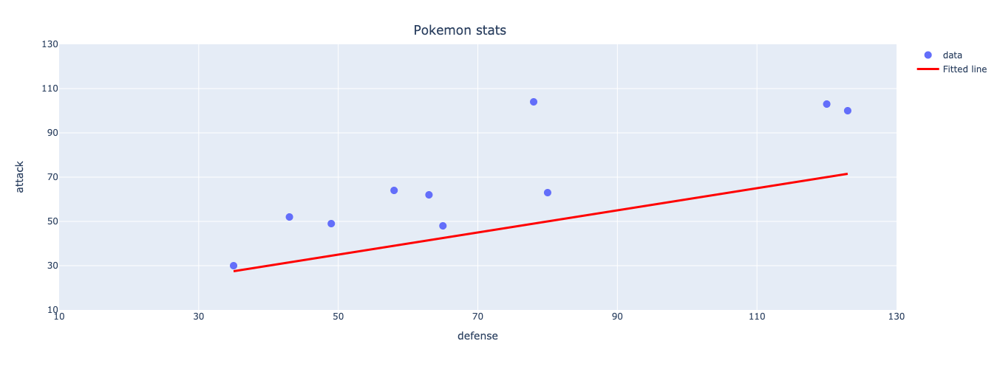

In [68]:
plot_pokemon(x, y, y_hat)

In [69]:
slopes = np.arange(0.4, 1.65, 0.05)

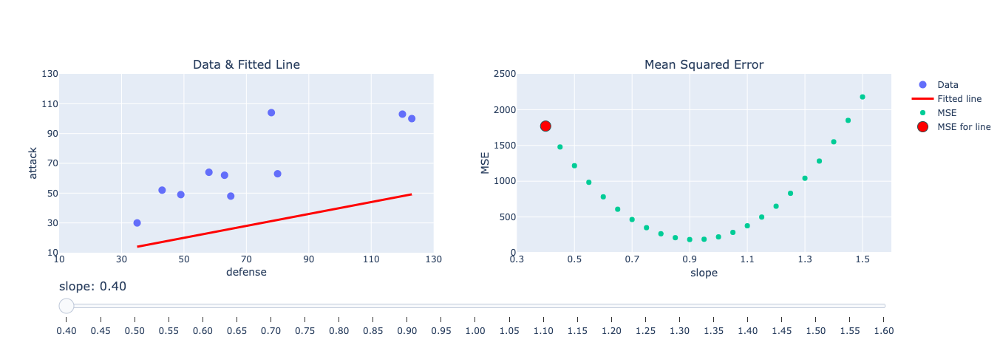

In [70]:
plot_grid_search(x, y, slopes, mean_squared_error)

## 4. Gradient Descent With One Parameter
---
> Def: 
> - Gradient descent is an iterative optimization algorithm where we have a ***loss function***, ***gradient of loss function*** with respect of model parameters. 
> - We start with some model parameter, calculate the gradient, update gradient by adjusting the gradient by {learning rate * gradient}. Repeat the process over and over.

- The <b><font color=salmon size=4>gradient</font></b> is just a vector of (partial) derivatives of the loss function w.r.t the model parameters
- In plain English, the gradient will tell us two things:
    1. Which direction to move our parameter in to decrease loss (i.e., should we increase or decrease its value?)
    2. How far to move it (i.e., should we adjust it by 0.1 or 2 or 50 etc.?)
>If you need a refresher on gradients, check out [Appendix A](appendixA_gradients.ipynb)

- Recall from calculus that the **gradient actually points in the direction of steepest ascent** (read more in [Appendix A](appendixA_gradients.ipynb))
- ***We want to move in the direction of <b><font color=salmon size=4>steepest descent</font></b> (the negative of the gradient) to reduce our loss***

### 1). Gradient Descent function

- Let's forget about the intercept now and just work with this simple linear model: $\hat{y_i}=wx_i$
- For our model the loss function has the form:

$$f(w)=\frac{1}{n}\sum^{n}_{i=1}((wx_i)-y_i))^2$$

- The <b><font color=salmon size=4>gradient of this function</font></b> with respect to the parameter $w$ is:

$$\frac{d}{dw}f(w)=\frac{1}{n}\sum^{n}_{i=1}2x_i(wx_i - y_i)$$

- Let's code that up:
- Let's calculate the gradient of our loss function at a slope of $w = 0.5$:

In [71]:
def gradient(x, y, w):
    return 2 * (x * (w * x - y)).mean()

gradient(x, y, w=0.5)

-4942.8

- The amount we adjust our slope each iteration is controlled by a <b><font color=salmon size=4>"learning rate"</font></b>, denoted $\alpha$ (note the minus in the equation below which accounts for the "descent" as discussed above):
> Flip the sign of gradient: if gradient is negative, make w bigger, if gradient is positive, make w smaller

$$w_{new} = w - \alpha \times gradient$$

$$w_{new} = w - \alpha \frac{d}{dw}f(w)$$

- $\alpha$ is a hyperparameter that can be optimized, typical values range from 0.001 to 0.9
- With the math out of the way, we're now ready to use gradient descent to optimize our slope
- <b><font color=salmon size=4>When to stop gradient descent</font></b>
    1. the step size is smaller than some threshold ($\epsilon$); or,
    2. a certain number of steps is completed (`max_iterations`)
- So the pseudo code for gradient descent boils down to this:

```sh
1. begin with with some arbitrary w
while stopping criteria not met:
    2. calculate mean gradient across all examples
    3. update w based on gradient and learning rate
    4. repeat
```

- Let's go ahead and implement that now:

> `g = gradient(x, y, w)`  # calculate current gradient by <b><font color=salmon size=4>using all dataset</font></b>

In [72]:
def gradient_descent(x, y, w, alpha, ϵ=2e-4, max_iterations=5000, print_progress=10):
    """Gradient descent for optimizing slope in simple linear regression with no intercept."""
    
    print(f"Iteration 0. w = {w:.2f}.")
    iterations = 1  # init iterations
    dw = 2 * ϵ      # init. dw
    
    while abs(dw) > ϵ and iterations <= max_iterations:
        g = gradient(x, y, w)  # calculate current gradient by ***using all dataset***
        dw = alpha * g    # change in w
        w -= dw                # adjust w based on gradient * learning rate
        if iterations % print_progress == 0:  # periodically print progress
            print(f"Iteration {iterations}. w = {w:.2f}.")
        iterations += 1        # increase iteration
        
    print("Terminated!")
    print(f"Iteration {iterations - 1}. w = {w:.2f}.")

### 2). Learning rate

> in the case of linear regression, the MSE loss is [convex](https://en.wikipedia.org/wiki/Convex_function), that basically means that there is a "global minimum" that gradient descent will always be able to find (if we do enough iterations and the learning rate is not too high that the gradients explode).

### How does learning rate affect convergence & number of iterations?

- In a convex simple linear model:
    - As learning rate increases, the number of iterations to convergence typically decreases - makes sense, a higher learning rate means we are taking bigger steps towards the minimum. 
    - **However** the final learning rate of 0.022 actually converged slower than a rate of 0.001. The rate is high and is causing the weight to bounce around the minimum, like the example we saw in lecture.
    - If the learning rate is way too high, it will never converge.
    - The number of iterations does depend on the initial weight `w0`. If we start closer to the optimal `w`, we will need less iterations.
    - Gradient descent always converge to the same optimum `w` regardless of the initial weight (`w0`) value because this problem is convex (assuming we run enough iterations and the learning rate is not too high that everything explodes).

<center>
<img src="img/loss_iter.png" width="500" height="400" />
</center>

- In a non-convex non-linear model:
    - the number of iterations depends on how close we start to a minimum.
    - the final answer depends on the initial weights because there are many minima we could get stuck in here.


In [73]:
gradient_descent(x, y, w=0.5, alpha=0.00001)

Iteration 0. w = 0.50.
Iteration 10. w = 0.80.
Iteration 20. w = 0.88.
Iteration 30. w = 0.91.
Iteration 40. w = 0.92.
Terminated!
Iteration 45. w = 0.92.


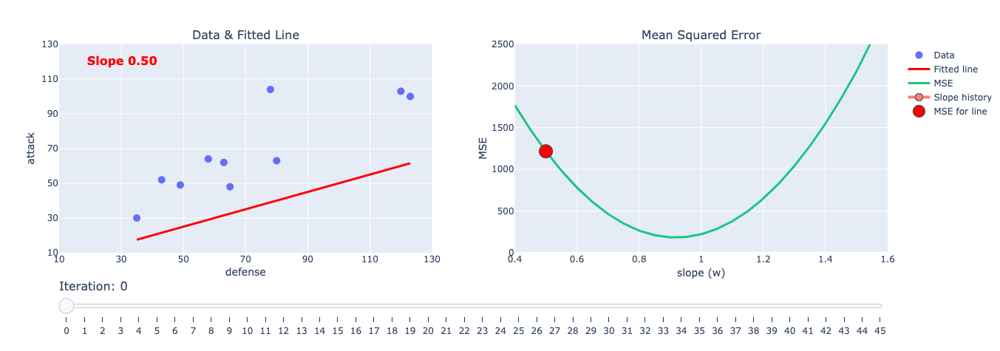

In [74]:
plot_gradient_descent(x, y, w=0.5, alpha=0.00001)

In [75]:
gradient_descent(x, y, w=0.5, alpha=0.00005)

Iteration 0. w = 0.50.
Terminated!
Iteration 9. w = 0.92.


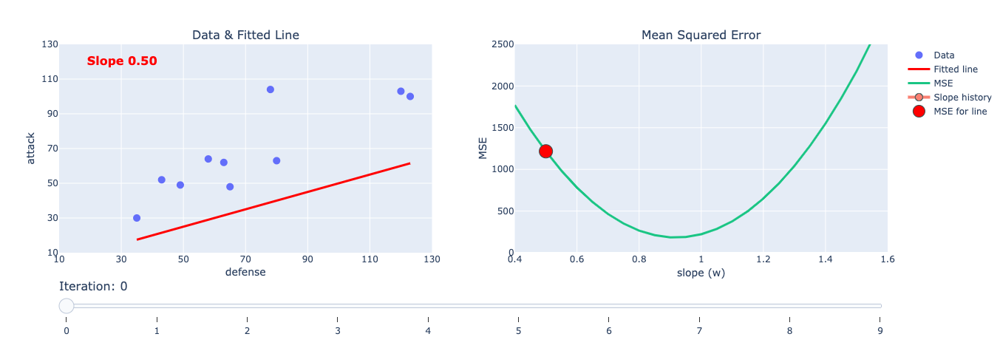

In [76]:
plot_gradient_descent(x, y, w=0.5, alpha=0.00005)

> alpha=0.00015
> - Bounce around each side
> - The magnitude of the Gradient is smaller than last one
> - and step size is smaller and smaller

In [77]:
gradient_descent(x, y, w=0.5, alpha=0.00015)

Iteration 0. w = 0.50.
Iteration 10. w = 0.89.
Iteration 20. w = 0.92.
Iteration 30. w = 0.92.
Terminated!
Iteration 33. w = 0.92.


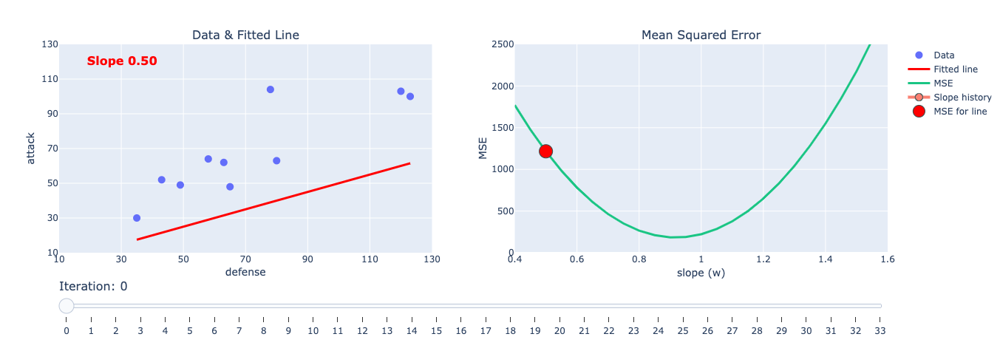

In [78]:
plot_gradient_descent(x, y, w=0.5, alpha=0.00015)

> alpha=0.00018
> - Bounce around each side
> - The magnitude of the Gradient is larger than last one
> - and step size is bigger and bigger


In [79]:
gradient_descent(x, y, w=0.5, alpha=0.00018, max_iterations=10)

Iteration 0. w = 0.50.
Iteration 10. w = -0.45.
Terminated!
Iteration 10. w = -0.45.


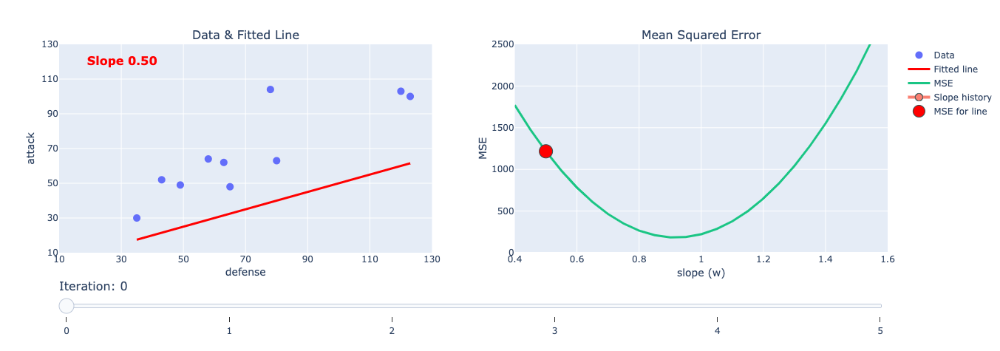

In [80]:
plot_gradient_descent(x, y, w=0.5, alpha=0.00018, max_iterations=5)

## 5. Gradient Descent With Two Parameters
---

- Let's extend the above workflow to two parameters, the intercept ($w_0$) and the slope ($w_1$)


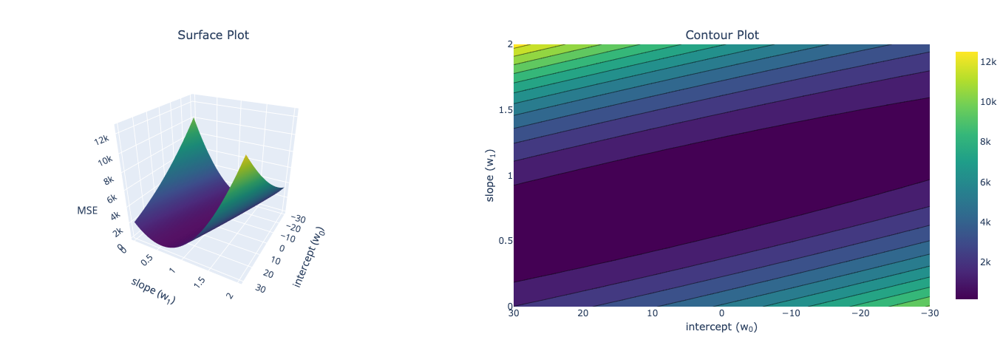

In [81]:
slopes = np.arange(0, 2.05, 0.05)
intercepts = np.arange(-30, 31, 2)
plot_grid_search_2d(x, y, slopes, intercepts)

- Above is the surface of MSE for different values of `intercept` ($w_0$) and `slope` ($w_1$)
- The approach is exactly as before, but we're operating on two parameters now and the gradient of the intercept is a little different to the slope:

$$f(w)=\frac{1}{n}\sum^{n}_{i=1}((w_0 + w_1x)-y_i))^2$$

$$\frac{\partial{}}{\partial{}w_0}f(w)=\frac{1}{n}\sum^{n}_{i=1}2((w_0 + w_1x) - y_i)$$

$$\frac{\partial{}}{\partial{}w_1}f(w)=\frac{1}{n}\sum^{n}_{i=1}2x_i((w_0 + w_1x) - y_i)$$

- Let's define a function that returns an array of the gradient (partial derivatives) of the slope and intercept:

In [82]:
def gradient(x, y, w):
    grad_w0 = (1/len(x)) * 2 * sum(w[0] + w[1] * x - y)
    grad_w1 = (1/len(x)) * 2 * sum(x * (w[0] + w[1] * x - y))
    return np.array([grad_w0, grad_w1])

In [83]:
gradient(x, y, w=[10, 0.5])

array([  -43.6, -3514.8])

### 1). Gradient descent function

In [84]:
def gradient_descent(x, y, w, alpha, ϵ=2e-4, max_iterations=5000, print_progress=10):
    """Gradient descent for optimizing simple linear regression."""
    
    print(f"Iteration 0. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")
    iterations = 1  # init iterations
    dw = np.array(2 * ϵ)      # init. dw
    
    while abs(dw.sum()) > ϵ and iterations <= max_iterations:
        g = gradient(x, y, w)  # calculate current gradient
        dw = alpha * g         # change in w
        w -= dw                # adjust w based on gradient * learning rate
        if iterations % print_progress == 0:  # periodically print progress
            print(f"Iteration {iterations}. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")
        iterations += 1        # increase iteration
        
    print("Terminated!")
    print(f"Iteration {iterations - 1}. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")

In [85]:
gradient_descent(x, y, w=[10, 0.5], alpha=0.00001)

Iteration 0. Intercept 10.00. Slope 0.50.
Iteration 10. Intercept 10.00. Slope 0.71.
Iteration 20. Intercept 10.00. Slope 0.77.
Iteration 30. Intercept 10.00. Slope 0.79.
Iteration 40. Intercept 10.00. Slope 0.80.
Terminated!
Iteration 43. Intercept 10.00. Slope 0.80.


### 2). Large slope gradient problem

- Hmm... our algorithm worked but our intercept never changed
- That's because the slope gradient is **wayyyyy** bigger than the intercept gradient

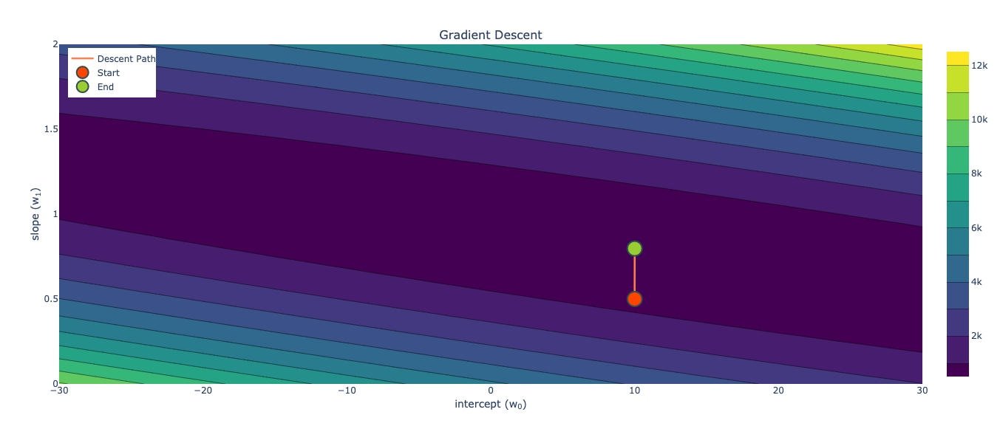

In [86]:
plot_gradient_descent_2d(x, y, w=[10, 0.5], m_range=np.arange(0, 2.05, 0.05), b_range=np.arange(-30, 31, 2), alpha=0.00001)

- Let's see what the real value of these params are using sklearn's implementation:

In [87]:
m = LinearRegression().fit(np.atleast_2d(x).T, y)
print(f"sklearn inter = {m.intercept_:.2f}")
print(f"sklearn slope = {m.coef_[0]:.2f}")

sklearn inter = 14.02
sklearn slope = 0.75


### 3). Scaling

- There are a few ways we can solve this problem, but the most common way is to simply scale your features before gradient descent

In [88]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(np.atleast_2d(x).T).flatten()
x_scaled

array([-1.28162658, -0.99995041, -0.78869328, -0.47180759, -0.29575998,
       -0.22534094,  0.23238284,  0.30280188,  1.71118274,  1.81681131])

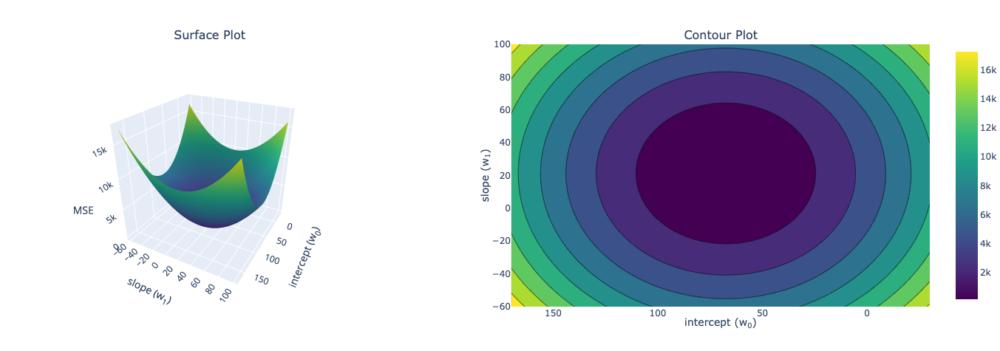

In [89]:
slopes = np.arange(-60, 101, 2)
intercepts = np.arange(-30, 171, 2)
plot_grid_search_2d(x_scaled, y, slopes, intercepts)

- Now let's check a random gradient:

In [90]:
gradient(x_scaled, y, w=[10, 0.5])

array([-115.        ,  -41.54718577])

- Great, they are on a similar scale now, let's retry gradient descent with our scaled data:

In [91]:
gradient_descent(x_scaled, y, w=[10, 2], alpha=0.2)

Iteration 0. Intercept 10.00. Slope 2.00.
Iteration 10. Intercept 67.15. Slope 21.16.
Iteration 20. Intercept 67.50. Slope 21.27.
Terminated!
Iteration 25. Intercept 67.50. Slope 21.27.


In [92]:
m = LinearRegression().fit(np.atleast_2d(x_scaled).T, y)
print(f"sklearn inter = {m.intercept_:.2f}")
print(f"sklearn slope = {m.coef_[0]:.2f}")

sklearn inter = 67.50
sklearn slope = 21.27


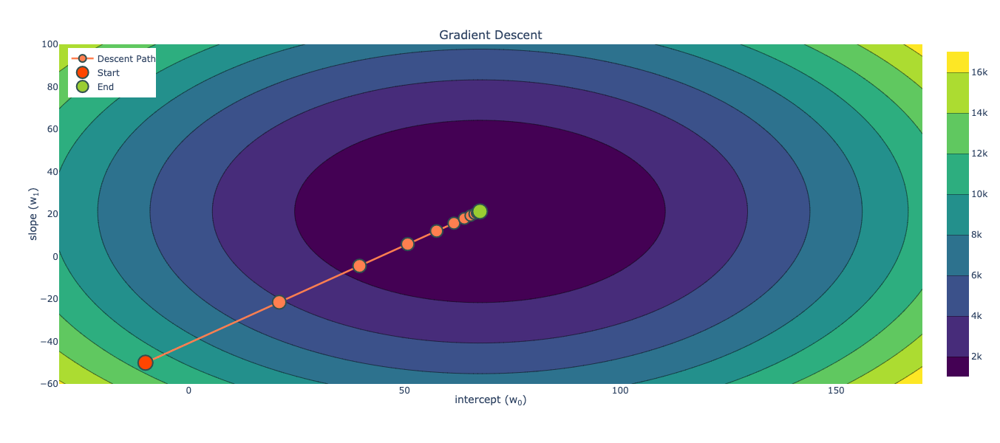

In [93]:
plot_gradient_descent_2d(x_scaled, y, w=[-10, -50], alpha=0.2, m_range=np.arange(-60, 101, 2), b_range=np.arange(-30, 171, 2), markers=True)

- Once again, changing the learning rate will affect our descent (I added some markers on this plot to show you that we're bouncing back-and-forth):

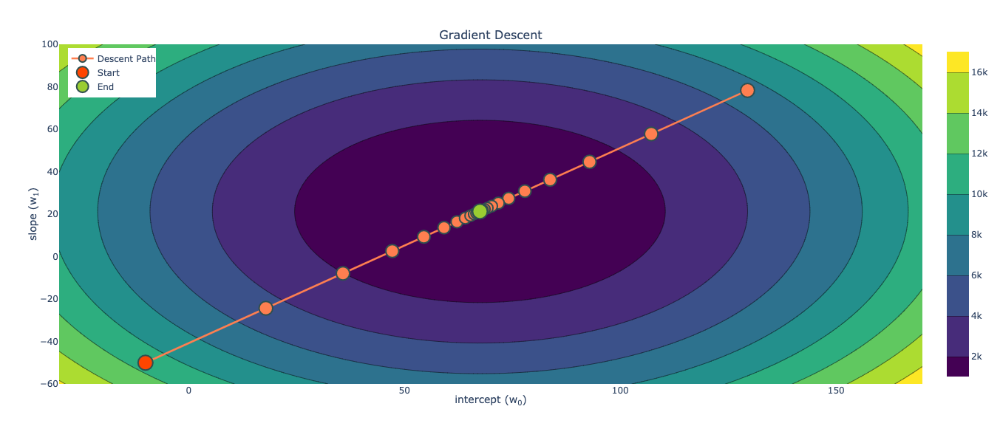

In [94]:
plot_gradient_descent_2d(x_scaled, y, w=[-10, -50], alpha=0.9, m_range=np.arange(-60, 101, 2), b_range=np.arange(-30, 171, 2), markers=True)

## 6. Other Optimization Algorithms
---

- When you saw us using gradients earlier on you might have thought, why not just set the derivative to 0 and solve?
- You sure could do this! And in general, if a closed form solution exists for your problem, you should typically use it
- However:
    - Most problems in ML do not have a closed-form solution
    - Even if a closed form solution exists (e.g., linear regression), it can be extremely computationally expensive to compute if your dataset is large (many observations and/or many features)
- In these cases, optimization algorithms like GD are appropriate choices
- In actuality you will almost never use vanilla GD in practice because it's actually very slow (but the intuition behind it forms the basis of tons of optimization algorithms so it's a great place to start learning)
- We'll look at a computationally lighter version of GD next lecture (stochastic gradient descent) and there are also many other algorithms available!
- You can explore the `scipy` function `minimize` to play around with some of these algorithms:

In [95]:
from scipy.optimize import minimize

- `minimize` takes as argument 
    - the function to minimize
    - the function's gradient
    - the starting parameter values
- For a linear regression model, the MSE loss and gradient take the general form:

$$f(w)=\frac{1}{n}\sum^{n}_{i=1}(w^Tx_i-y_i)^2$$

$$\frac{\partial{}}{\partial{}f(w)}=\frac{2}{n}\sum^{n}_{i=1}(w^Tx_i-y_i)x_i$$

In [96]:
def mse(w, X, y):
    """Mean squared error."""
    return np.mean((X @ w - y) ** 2)


def mse_grad(w, X, y):
    """Gradient of mean squared error."""
    return 2 * (X.T @ (X @ w) - X.T @ y) / len(X)

In [97]:
w = np.array([10, 2])
x = np.hstack((np.ones((len(x), 1)), x_scaled[:, None]))  # appening a column of 1's for the intercept

In [98]:
minimize(mse, w, jac=mse_grad, args=(x, y))

      fun: 155.4842457601904
 hess_inv: array([[ 0.55050293, -0.15066824],
       [-0.15066824,  0.94949707]])
      jac: array([0.00000000e+00, 1.70530257e-14])
  message: 'Optimization terminated successfully.'
     nfev: 5
      nit: 2
     njev: 5
   status: 0
  success: True
        x: array([67.5       , 21.27359289])

In [99]:
minimize(mse, w, jac=mse_grad, args=(x, y)).x  # these are the weights, it's a bit confusing because they are called "x"

array([67.5       , 21.27359289])

There are plenty of methods you can look into (most give the same answers):

In [100]:
for method in ["CG", "L-BFGS-B", "SLSQP", "TNC"]:
    print(f"Method: {method}, Weights: {minimize(mse, w, jac=mse_grad, args=(x, y), method=method).x}")

Method: CG, Weights: [67.5        21.27359289]
Method: L-BFGS-B, Weights: [67.5        21.27359289]
Method: SLSQP, Weights: [67.5        21.27359289]
Method: TNC, Weights: [67.5        21.27359287]


## 7. Lecture Exercise: Optimizing Logistic Regression


In [101]:
df = pd.read_csv("data/pokemon.csv", index_col=0, usecols=['name', 'defense', 'legendary']).reset_index()
leg_ind = df["legendary"] == 1
df = pd.concat(
    (df[~leg_ind].sample(sum(leg_ind), random_state=123), df[leg_ind]),
    ignore_index=True,
).sort_values(by='defense')



df.head(10)

,name,defense,legendary
23,Sunkern,30,0
2,Gastly,30,0
127,Cosmog,31,1
25,Mankey,35,0
5,Remoraid,35,0
6,Kirlia,35,0
60,Tyrogue,35,0
67,Poochyena,35,0
58,Buizel,35,0
11,Noibat,35,0


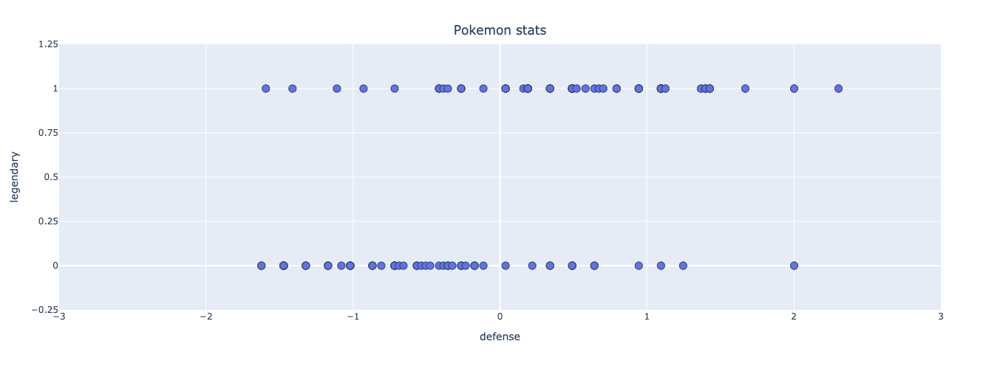

In [102]:
x = StandardScaler().fit_transform(df[['defense']]).flatten()  # we saw before the standardizing is a good idea for optimization
y = df['legendary'].to_numpy()
plot_logistic(x, y)

> trick of ones

- We'll be using the "trick of ones" to help us implement these computations efficiently
- For example, if we have a simple linear regression model with an intercept and a slope:

$$\hat{y} = \boldsymbol{w^T}\boldsymbol{x} = w_0\times{}1 + w_1\times{}x$$

- Let's represent that in matrix form:

$$\begin{bmatrix} y_1 \\ y_2 \\ \vdots \\ y_n \end{bmatrix}=\begin{bmatrix} 1 & x_1 \\ 1 & x_2 \\ \vdots & \vdots \\ 1 & x_n \end{bmatrix} \begin{bmatrix} w_0 \\ w_1 \end{bmatrix}$$

- Now we can calculate $\mathbf{y}$ using matrix multiplication and the "matmul" Python operator:

![](img/matmul.png)

In [103]:
w = np.array([2, 3])
X = np.array([[1, 5], [1, 3], [1, 4]])
X @ w

array([17, 11, 14])

### 1). logistic regression model
- We're going to create a logistic regression model to classify a Pokemon as "legendary" or not
- Recall that in logistic regression we map our linear model to a probability:

$$z=\boldsymbol{w^T}\boldsymbol{x}$$

$$P(y = 1) = \frac{1}{(1+\exp(-z))}$$

- For classification purposes, we typically then assign this probability to a discrete class (0 or 1) based on a threshold (0.5 by default):

$$y=\left\{
\begin{array}{ll}
    0, & P(y = 1)\le0.5 \\
    1, & P(y = 1)>0.5 \\
\end{array} 
\right.$$ 

- Let's code that up:

In [104]:
def sigmoid(x, w, output="soft", threshold=0.5):
    p = 1 / (1 + np.exp(-x @ w))
    if output == "soft":
        return p
    elif output == "hard":
        return np.where(p > threshold, 1, 0)

In [105]:
ones = np.ones((len(x), 1))
X = np.hstack((ones, x[:, None]))  # add column of ones for the intercept term

In [106]:
w = [-1, 3] # initial intercept and weight

In [107]:
y_soft = sigmoid(X, w)
y_hard = sigmoid(X, w, "hard")

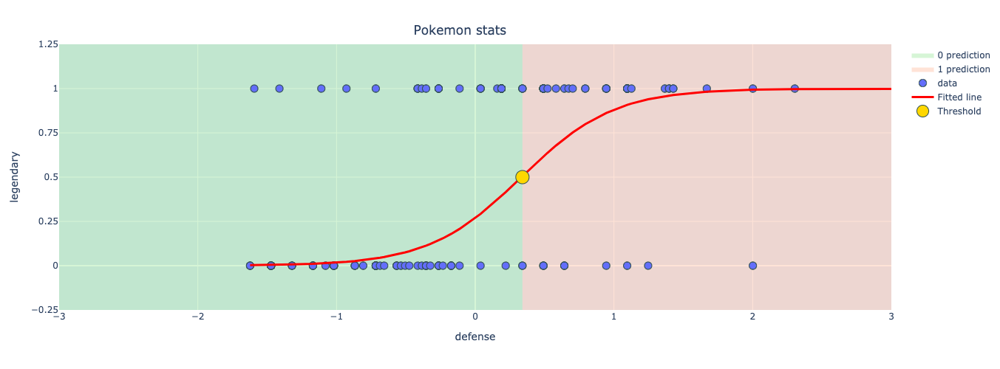

In [108]:
plot_logistic(x, y, y_soft, threshold=0.5)

> accuracy of the model

In [109]:
def accuracy(y, y_hat):
    return (y_hat == y).sum() / len(y)

accuracy(y, y_hard)

0.7142857142857143

### 2). optimize weight using GD

- Just like in the linear regression example earlier, we want to optimize the values of our weights!
- We need a loss function!
- As you discussed in 573, we use the ***log loss (cross-entropy loss)*** to optimize logistic regression
- Here's ***the log loss (cross-entropy loss)***
  
$$f(w)=-\frac{1}{n}\sum_{i=1}^ny_i\log\left(\frac{1}{1 + \exp(-w^Tx_i)}\right) + (1 - y_i)\log\left(1 - \frac{1}{1 + \exp(-w^Tx_i)}\right)$$

- its gradient (see [Appendix B](appendixB_logistic-loss.ipynb) if you want to learn more about these, they're actually quite simple!):

$$\frac{\partial f(w)}{\partial w}=\frac{1}{n}\sum_{i=1}^nx_i\left(\frac{1}{1 + \exp(-w^Tx_i)} - y_i\right)$$

In [110]:
def logistic_loss(w, X, y):
    return -(y * np.log(sigmoid(X, w)) + (1 - y) * np.log(1 - sigmoid(X, w))).mean()


def logistic_loss_grad(w, X, y):
    return (X.T @ (sigmoid(X, w) - y)) / len(X)

In [111]:
# optimize loss using minimize
w_opt = minimize(logistic_loss, np.array([-1, 1]), jac=logistic_loss_grad, args=(X, y)).x
w_opt

array([0.05153269, 1.34147091])

- Let's check our solution against the `sklearn` implementation:

In [112]:
lr = LogisticRegression(penalty='none').fit(x.reshape(-1, 1), y)
print(f"w0: {lr.intercept_[0]:.2f}")
print(f"w1: {lr.coef_[0][0]:.2f}")

w0: 0.05
w1: 1.34


- This is what the optimized model looks like:

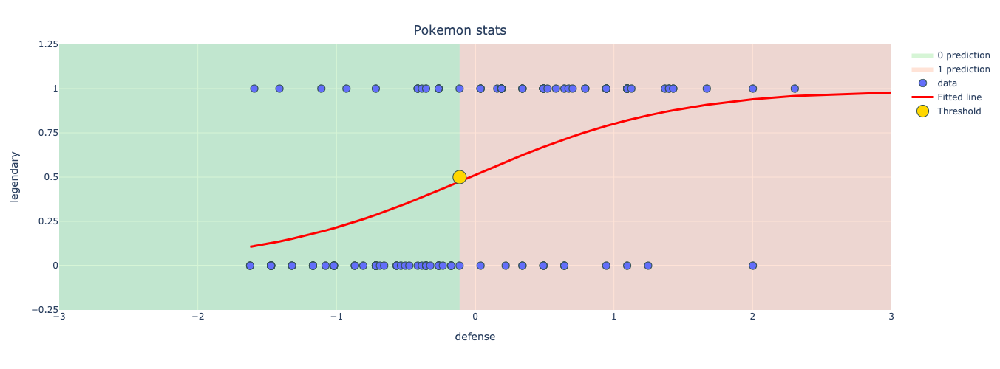

In [113]:
y_soft = sigmoid(X, w_opt)
plot_logistic(x, y, y_soft, threshold=0.5)

In [114]:
y_hard = sigmoid(X, w_opt, "hard")
accuracy(y, y_hard)

0.8

- Checking that against our sklearn model:

In [115]:
lr.score(x.reshape(-1, 1), y)

0.8

 ### 3). With more parameters

In [116]:
df = pd.read_csv("data/pokemon.csv", index_col=0, usecols=['name', 'defense', 'attack', 'speed', 'legendary']).reset_index()
leg_ind = df["legendary"] == 1
df = pd.concat(
    (df[~leg_ind].sample(sum(leg_ind), random_state=123), df[leg_ind]),
    ignore_index=True,
)
df.head()

,name,attack,defense,speed,legendary
0,Roggenrola,75,85,15,0
1,Gible,70,45,42,0
2,Gastly,35,30,80,0
3,Minun,40,50,95,0
4,Marill,20,50,40,0


In [117]:
x = StandardScaler().fit_transform(df[["defense", "attack", "speed"]])
X = np.hstack((np.ones((len(x), 1)), x))
y = df["legendary"].to_numpy()

In [118]:
w_opt = minimize(logistic_loss, np.zeros(X.shape[1]), jac=logistic_loss_grad, args=(X, y), method="L-BFGS-B").x
w_opt

array([-0.23259512,  1.33705304,  0.52029373,  1.36780376])

In [119]:
lr = LogisticRegression(penalty="none").fit(x, y)
print(f"w0: {lr.intercept_[0]:.2f}")
for n, w in enumerate(lr.coef_[0]):
    print(f"w{n+1}: {w:.2f}")

w0: -0.23
w1: 1.34
w2: 0.52
w3: 1.37


# Lecture 3: Stochastic Gradient Descent

## 1. Motivation
---

- Last lecture we looked at "vanilla" gradient descent
- Almost all loss functions you'll use in ML involve a sum over all the (training) data, e.g., mean squared error:

$$f(w)=\frac{1}{n}\sum^{n}_{i=1}(h_w(x_i)-y_i)^2$$

- Here $f(w)$ is the value of the loss function, $h_w(x)$ is the model we wish to fit, e.g., for linear regression: $h_w(x)=w^Tx$
- The goal is to find the weights $\boldsymbol{w}$ that minimize the loss function
- With gradient descent we:
    1. start with some arbitrary $\boldsymbol{w}$
    2. calculate the gradient <b><font color=salmon size=4>using all training examples</font></b>
    3. use the gradient to adjust $\boldsymbol{w}$
    4. repeat for $I$ iterations or until the step-size is sufficiently small
- But if we have large $n$ and/or $\boldsymbol{w}$ vanilla gradient descent becomes very <b><font color=salmon size=4>computationally expensive</font></b> (when we get to deep learning, we'll have models where the number of weights to optimize is in the millions!)
- Say `n` = 1,000,000, we have 1000 parameters to optimize, and we do 1000 iterations = $10^{12}$ computations!!
- We can reduce this workload by using just <b><font color=salmon size=4>a fraction of our dataset</font></b> to update our parameters each iteration (rather than using the whole data set)
- This is called "stochastic gradient descent"

## 2. Stochastic Gradient Descent

- Gradient Descent:
$$w_{j+1}=w_{j}-\alpha_t\frac{\partial}{\partial w_j}f(w_j)$$
- Stochastic Gradient Descent:
$$w_{j+1}=w_{j}-\alpha_t\frac{\partial}{\partial w_j}f_i(w_j)$$
- Pretty simple!
- What exactly is the difference in the above equations? Well one of them includes a subscript $i$
- That means, instead of updating our parameters based on a gradient calculated using all training data, we simply use **one of our data points** (the $i$th one)
- This is best seen by example, let's use the Pokemon dataset from last week:

#### 1). data

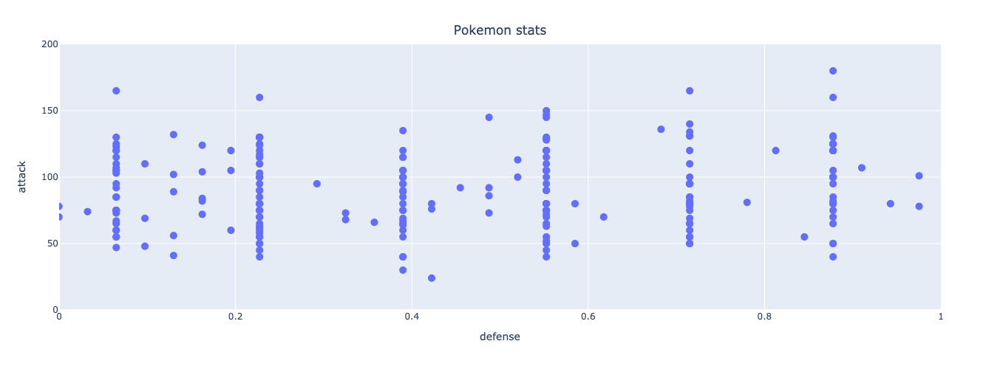

In [120]:
df = (pd.read_csv("data/pokemon.csv", usecols=['name', 'defense', 'attack'], index_col=0)
        .reset_index()
     )
x = StandardScaler().fit_transform(df[['defense']]).flatten()
y = df['attack'].to_numpy()
plot_pokemon(x, y, x_range=[0, 1], y_range=[0, 200], dx=0.2, dy=50)

In [121]:
X = np.hstack((np.ones((len(x), 1)), x[:, None]))
X

array([[ 1.        , -0.78077335],
       [ 1.        , -0.32548801],
       [ 1.        ,  1.62573488],
       ...,
       [ 1.        , -0.65069183],
       [ 1.        ,  0.91028648],
       [ 1.        ,  1.36557183]])

#### 2). Gradient using a single point

- Let's fit a simple linear model to this data: $\hat{y_i}=w_0+w_1x_i=w^Tx_i$
- Recall from last lecture that the gradient of MSE for a linear regression model is:

$$\frac{\partial{}}{\partial{}f(w)}=\frac{2}{n}\sum^{n}_{i=1}(w^Tx_i-y_i)x_i$$

In [122]:
def gradient(w, X, y):
    """Gradient of mean squared error."""
    return 2 * (X.T @ (X @ w) - X.T @ y) / len(X)

- calculate the gradient for parameters `(w0, w1)` = `(-20, -5)` using the full data set:

In [123]:
w = np.array([-20, -5])
gradient(w, X, y)

array([-195.71535581,  -40.14066881])

- calculate the gradient again using just a single random point (re-run this as many times as you like):

In [124]:
i = np.random.randint(0, len(X), 1)
print("Selected point:")
display(df.iloc[i])
print("      Gradient: [intercept, slope]")
print(f"      All data: {[round(_, 2) for _ in gradient(w, X, y)]}")
print(f"Data point {i[0]:03}: {[round(_, 2) for _ in gradient(w, X[i], y[i])]}")

Selected point:


,name,attack,defense
74,Graveler,95,115


      Gradient: [intercept, slope]
      All data: [-195.72, -40.14]
Data point 074: [-243.66, -332.73]


- Not surprisingly, the gradient calculated using just one data point is (usually) different to the gradient calculated using all data points
- For visualization purposes, let's assume the intercept is fixed and just look at the gradient of the slope parameter ($w_1$) at $w_1=-5$ at different data points:

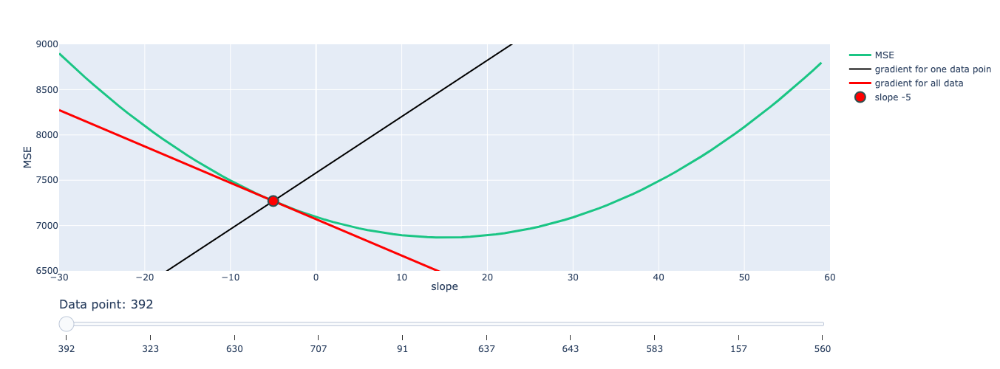

In [125]:
plot_random_gradients(x, y, w=w[1], seed=2020)  # re-run to get different datapoints

- Notice here that at a slope of -5, our single-point gradients vary in direction and magnitude
- Let's plot a histogram of the gradient of each data point at a slope of -5:

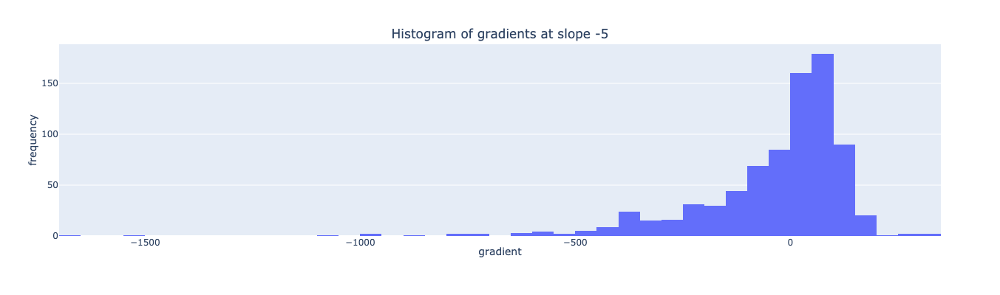

In [126]:
plot_gradient_histogram(x, y, w=w[1])

- The histogram is left-skewed, indicating that more often that not, our gradient is negative (i.e., we need to increase our slope to decrease our loss - if you look at the plot above this one, you'll see that makes sense!)
- This means that we're <b><font color=salmon size=4>more likely to move towards the minimum even though we only use a single data point!</font></b>
- Hopefully you're semi-convinced that using just one data point is computational way faster, and mathematically not a totally horrible idea
- Let's see stochastic gradient descent in action in the 2d case:
    - It's pretty much the same as we saw last lecture, except that we pick a random data point at which to calculate the gradient (which is why we call it "stochastic")
    - I've also removed the "tolerance" termination criteria for simplicity

#### 3). SGD function

In [127]:
def stochastic_gradient_descent(x, y, w, alpha, num_iterations=300, print_progress=100, seed=None):
    """Stochastic gradient descent for simple linear regression."""
    
    print(f"Iteration 0. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")
    iterations = 1        # init iterations
    if seed is not None:  # init seed (if given)
        np.random.seed(seed)
        
    while iterations <= num_iterations:
        i = np.random.randint(len(x))            # <--- this is the only new bit! <---
        g = gradient(w, x[i, None], y[i, None])  # calculate current gradient
        w -= alpha * g                           # adjust w based on gradient * learning rate
        if iterations % print_progress == 0:     # periodically print progress
            print(f"Iteration {iterations}. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")
        iterations += 1  # increase iteration
        
    print("Terminated!")
    print(f"Iteration {iterations - 1}. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")

- our result

In [128]:
w = [-20, -5]
alpha = 0.01
X = np.hstack((np.ones((len(x), 1)), x[:, None]))
stochastic_gradient_descent(X, y, w, alpha, seed=2020)

Iteration 0. Intercept -20.00. Slope -5.00.
Iteration 100. Intercept 69.19. Slope 21.12.
Iteration 200. Intercept 76.37. Slope 18.07.
Iteration 300. Intercept 78.32. Slope 17.21.
Terminated!
Iteration 300. Intercept 78.32. Slope 17.21.


- sklearn result

In [129]:
m = LinearRegression().fit(np.atleast_2d(x).T, y)
print(f"sklearn Intercept = {m.intercept_:.2f}")
print(f"sklearn Slope = {m.coef_[0]:.2f}")

sklearn Intercept = 77.86
sklearn Slope = 15.07


- We got pretty close! Let's see the path we took:

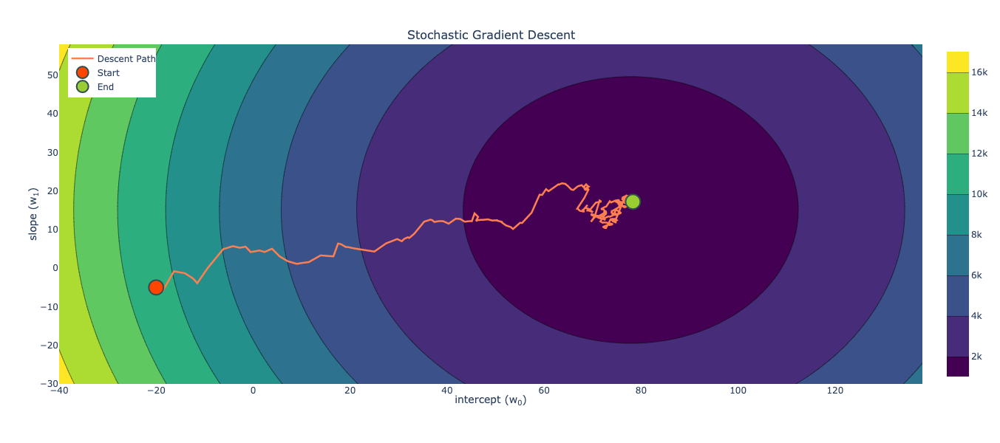

In [130]:
plot_gradient_descent_2d(x, y, w, alpha, np.arange(-30, 60, 2), np.arange(-40, 140, 2), max_iterations=300, stochastic=True, seed=2020)

- Above, we get to the minimum fairly quickly and <b><font color=salmon size=4>then bounce around</font></b>
- But notice how we bounce around a bit - we get this "noise" because we are <b><font color=salmon size=4>only basing our adjustment on one data point</font></b>. Remember, ***each data point has it's own idea of what the parameters should be***. But it turns out that most of them move us in the right direction (it's just a bit noisey)!
- Let's compare the result to regular gradient descent:

#### 4). SGD V.S. GD

- Obviously vanilla GD looks nice, but consider the computational savings
- In SGD we converged after 300 "iterations": 1 iteration = 1 data point, **so we did 300 computations**
- In GD we converged after 466 "iterations": 1 iteration = 801 data points, **so we did 466 x 801 = 373,266 computations**

In [131]:
def gradient_descent(x, y, w, alpha, ϵ=2e-4, max_iterations=5000, print_progress=100):
    """Gradient descent for optimizing simple linear regression."""
    
    print(f"Iteration 0. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")
    iterations = 1  # init iterations
    dw = np.array(2 * ϵ)      # init. dw
    
    while abs(dw.sum()) > ϵ and iterations <= max_iterations:
        g = gradient(w, x, y)  # calculate current gradient
        dw = alpha * g         # change in w
        w -= dw                # adjust w based on gradient * learning rate
        if iterations % print_progress == 0:  # periodically print progress
            print(f"Iteration {iterations}. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")
        iterations += 1        # increase iteration
        
    print("Terminated!")
    print(f"Iteration {iterations - 1}. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")

In [132]:
gradient_descent(X, y, w, alpha)

Iteration 0. Intercept -20.00. Slope -5.00.
Iteration 100. Intercept 64.88. Slope 12.41.
Iteration 200. Intercept 76.14. Slope 14.72.
Iteration 300. Intercept 77.63. Slope 15.02.
Iteration 400. Intercept 77.83. Slope 15.06.
Terminated!
Iteration 466. Intercept 77.85. Slope 15.07.


- This got us the *exact* same answer as sklearn, let's take a look at the path:

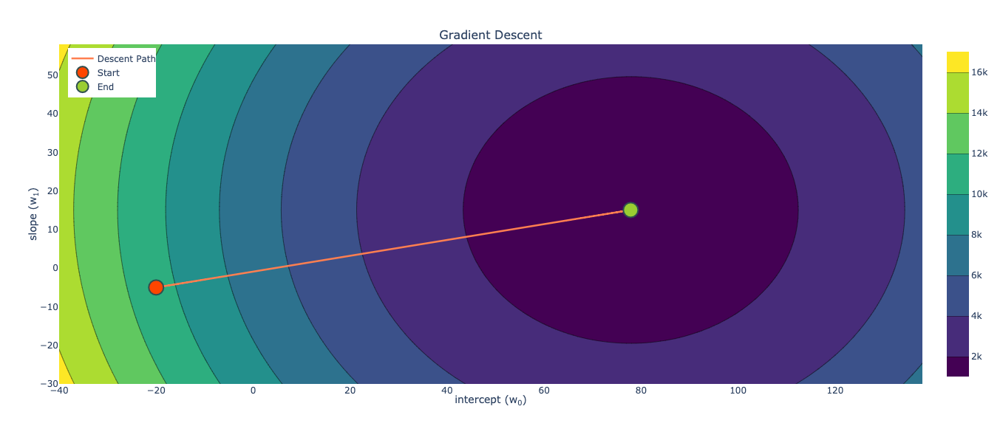

In [133]:
plot_gradient_descent_2d(x, y, w, alpha, np.arange(-30, 60, 2), np.arange(-40, 140, 2))

## 3. Mini-batch Gradient Descent
---

#### 1). Motivation

- Okay so it appears SGD is computationally better than GD, but GD is more accurate
- Is there an in-between compromise? Yes!
- Enter: minibatch stochastic gradient descent
- The idea here is simple, rather than calculating the gradient from just one random point, calculate it based on a "batch" of points:

#### 2). Batch

- The larger the batch, the closer we are to the gradient calculated using the whole dataset
- But also the bigger the batch, the more computations will be needed!
- Let's code it up, the code is almost the same as before but we are choosing `batch_size` random points now
> We'll be sampling without replacement in each iteration, I'll talk about that more later.

In [134]:
batch_size = 5
i = np.random.choice(range(len(X)), batch_size)
print("Selected point:")
display(df.iloc[i])
print("   Gradient of: [intercept, slope]")
print(f"      All data: {[round(_, 2) for _ in gradient(w, X, y)]}")
print(f"Data point {i[0]:03}: {[round(_, 2) for _ in gradient(w, X[i], y[i])]}")

Selected point:


,name,attack,defense
65,Machop,80,50
278,Pelipper,50,100
4,Charmeleon,64,58
19,Raticate,71,70
605,Beheeyem,75,75


   Gradient of: [intercept, slope]
      All data: [-195.72, -40.14]
Data point 065: [-175.22, 19.69]


- We would still expect the gradient calculated from a batch to be different to the gradient calculated using all the data, but not as different to using only a single point
- Once again let's visualize this for just the slope parameter to drive the point home:

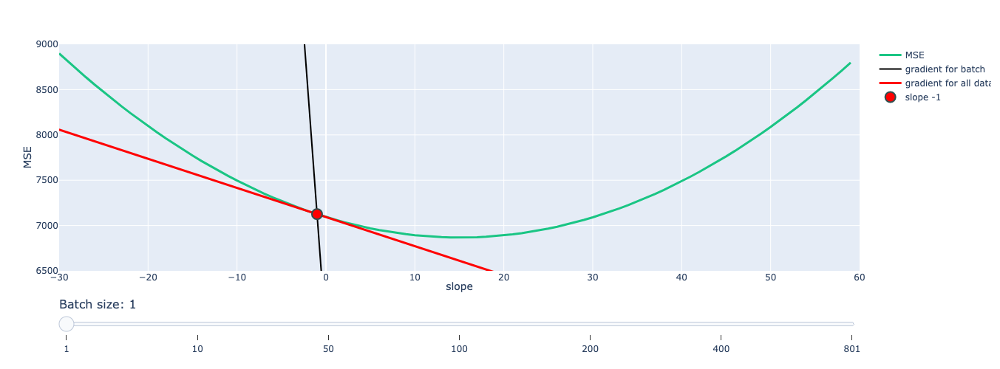

In [135]:
plot_minibatch_gradients(x, y, w=-1, batch_sizes=[1, 10, 50, 100, 200, 400, len(x)], seed=2020)

#### 3). MBGD

In [136]:
def minibatch_gradient_descent(x, y, w, alpha, batch_size, num_iterations=300, print_progress=100, seed=None):
    """Minibatch gradient descent for simple linear regression."""
    
    print(f"Iteration 0. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")
    iterations = 1        # init iterations
    if seed is not None:  # init seed (if given)
        np.random.seed(seed)
        
    while iterations <= num_iterations:
        i = np.random.choice(range(len(x)), batch_size, replace=False)  # <--- this is the only new bit! <---
        g = gradient(w, x[i], y[i])              # calculate current gradient
        w -= alpha * g                           # adjust w based on gradient * learning rate
        if iterations % print_progress == 0:     # periodically print progress
            print(f"Iteration {iterations}. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")
        iterations += 1  # increase iteration
        
    print("Terminated!")
    print(f"Iteration {iterations - 1}. Intercept {w[0]:.2f}. Slope {w[1]:.2f}.")

In [137]:
batch_size = 10
minibatch_gradient_descent(X, y, w, alpha, batch_size=batch_size, seed=2020)

Iteration 0. Intercept -20.00. Slope -5.00.
Iteration 100. Intercept 65.25. Slope 11.61.
Iteration 200. Intercept 75.84. Slope 12.49.
Iteration 300. Intercept 77.67. Slope 14.42.
Terminated!
Iteration 300. Intercept 77.67. Slope 14.42.


- Below, we still get the "wobbliness" of SGD but it's much smoother now!

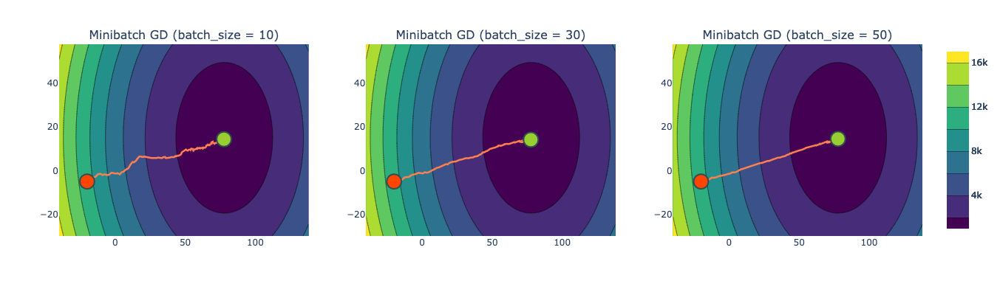

In [138]:
b_10 = plot_gradient_descent_2d(x, y, w, alpha, np.arange(-30, 60, 2), np.arange(-40, 140, 2), max_iterations=300, stochastic=True, batch_size=10, seed=2020)
b_30 = plot_gradient_descent_2d(x, y, w, alpha, np.arange(-30, 60, 2), np.arange(-40, 140, 2), max_iterations=300, stochastic=True, batch_size=30, seed=2020)
b_50 = plot_gradient_descent_2d(x, y, w, alpha, np.arange(-30, 60, 2), np.arange(-40, 140, 2), max_iterations=300, stochastic=True, batch_size=50, seed=2020)

plot_panel(b_10, b_30, b_50, t1="Minibatch GD (batch_size = 10)", t2="Minibatch GD (batch_size = 30)", t3="Minibatch GD (batch_size = 50)")

## 4. GD, SGD, MGD
- Assume we have a dataset of $n$ observations (rows)
- There are three terms you need to know when it comes to gradient descent:
    - **Iteration**: each time you update model weights
    - **Batch**: a subset of data used in an iteration
    - **Epoch**: the number of iterations to look at all $n$ observations (people sometimes also say a "full pass through the dataset")
    
|Method|Intercept|Slope|Iterations|Batch size / Data Per Iteration (total 801) |Data Points Used|Epochs|
|:---:|:---:|:---:|:---:|:---:|:---:|:---:|
|sklearn|77.86|15.07|-|-|-|-|
|GD|77.85|15.07|466|801|373,266|466
|SGD|76.33|11.26|300|1|300|0.37 = 300/801
|MGD|75.60|15.09|300|10|3000| 3.74 = 3000/801

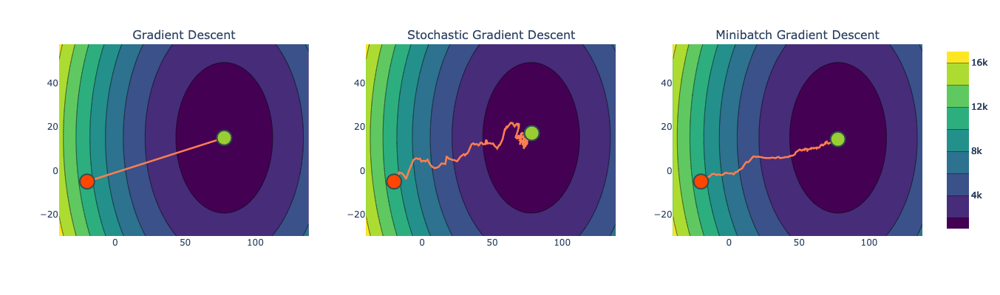

In [139]:
f1 = plot_gradient_descent_2d(x, y, w, alpha, np.arange(-30, 60, 2), np.arange(-40, 140, 2))
f2 = plot_gradient_descent_2d(x, y, w, alpha, np.arange(-30, 60, 2), np.arange(-40, 140, 2), max_iterations=300, stochastic=True, seed=2020)
f3 = plot_gradient_descent_2d(x, y, w, alpha, np.arange(-30, 60, 2), np.arange(-40, 140, 2), max_iterations=300, stochastic=True, batch_size=10, seed=2020)
plot_panel(f1, f2, f3)

## 5. Adam
---

- Up until now we've been using a constant learning rate ($\alpha$) in our algorithms
- There are two main ways we could potentially improve on this naive method:
    1. Use an ***adaptive*** learning rate - where we take big steps when we are far from the minimum of our loss function, and smaller steps when we are close to it;
    2. Use ***momentum*** - using how our learning rate has changed in past iterations to influence how it changes in future iterations
- But often when people use SGD they leave $\alpha$ constant and things tend to work out okay
- However these days in practice we use fancier variants of GD, such as Adam, which include more bells and whistles such as those I describe above. We'll be using Adam a lot through the rest of this course.
- These algorithms get pretty complex and it's beyond the scope of the course to know exactly how to derive them, but just know they are essentially fancier versions of GD (coding up Adam will be an optional question in the lab this week and if you're interested in reading more about these kinds of algorithms, see e.g. [here](https://ruder.io/optimizing-gradient-descent/))

## 6. Local Minima

- In Lab 1 we looked at how optimization algorithms like gradient descent are susceptible to ***getting stuck in local minima***
- SGD can help with this a bit due to ***the "jumpy" randomness*** in the search, but the ***main advantage of SGD vs GD is the computational savings***
- The above mentioned fancy algorithms like Adam that include things like momentum and adaptive learning rates are better designed to speed up convergence and try and avoid local minima. Here's a comparison of SGD vs Adam from my solution for the optional question in Lab 2 - notice how SGD gets "stuck" in a local minima, while Adam is able to navigate all the way to the global minima:

![](img/adam.png)

## 7. True/False questions

Answer True/False for the following:

1. In an iteration of stochastic gradient the loss might go up. (**True**)
2. Increasing the batch size results in slower, but better, iterations. (**True**)
3. One *epoch* of stochastic gradient takes about the same amount of time as one *iteration* of gradient descent. (**True**)
4. Stochastic gradient with a minibatch size of $n$ is the same thing as gradient descent. (**True**)
5. If you double the number of epochs and double the batch size, then nothing has changed with your optimization. (**False**)
6. The main benefit of stochastic gradient descent is that it can help avoid local minima. (**False**)

# Lecture 4: Introduction to Pytorch & Neural Networks

## 1. Introduction
<hr>

- PyTorch is a Python-based tool for scientific computing that provides several main features:
    - `torch.Tensor`, an n-dimensional array similar to that of `numpy`, but which can run on GPUs
    - Computational graphs for building neural networks
    - Automatic differentiation for training neural networks (more on this next lecture)
- You can install PyTorch from: https://pytorch.org/

## 2. PyTorch's Tensor
<hr>

- In PyTorch a tensor is just like NumPy's `ndarray` that we have become so familiar with.
- A key difference between PyTorch's `torch.Tensor` and numpy's `np.array` is that `torch.Tensor` was constructed to integrate with GPUs and PyTorch's computational graphs (more on that next lecture though)

### 1). `ndarray` vs `tensor`

- Creating and working with tensors is much the same as with numpy `ndarrays`
- You can create a tensor with `torch.tensor()`:

In [140]:
tensor_1 = torch.tensor([1, 2, 3])
tensor_2 = torch.tensor([1, 2, 3], dtype=torch.float32)
tensor_3 = torch.tensor(np.array([1, 2, 3]))

for t in [tensor_1, tensor_2, tensor_3]:
    print(f"{t}, dtype: {t.dtype}")

tensor([1, 2, 3]), dtype: torch.int64
tensor([1., 2., 3.]), dtype: torch.float32
tensor([1, 2, 3]), dtype: torch.int64


- PyTorch also comes with most of the `numpy` functions we're already familiar with:

In [141]:
torch.zeros(2, 2)  # zeroes

tensor([[0., 0.],
        [0., 0.]])

In [142]:
torch.ones(2, 2)  # ones

tensor([[1., 1.],
        [1., 1.]])

In [143]:
torch.randn(3, 2)  # random normal

tensor([[-1.1683,  0.3314],
        [ 0.4300,  0.4817],
        [-0.2372,  0.8025]])

In [144]:
torch.rand(2, 3, 2)  # rand uniform

tensor([[[0.2003, 0.1896],
         [0.0023, 0.6059],
         [0.4571, 0.9791]],

        [[0.5467, 0.3706],
         [0.9816, 0.9389],
         [0.1991, 0.5623]]])

- Just like in NumPy we can look at the shape of a tensor with the `.shape` attribute:

In [145]:
x = torch.rand(2, 3, 2, 2)
x.shape

torch.Size([2, 3, 2, 2])

In [146]:
x.ndim

4

### 2). Tensors and Data Types

- Different dtypes have different memory and computational implications (see the end of [Lecture 1](https://pages.github.ubc.ca/MDS-2020-21/DSCI_572_sup-learn-2_students/lectures/lecture1_floating-point.html#precision-vs-memory-vs-speed) or [Lecture 5 of DSCI 511](https://pages.github.ubc.ca/MDS-2020-21/DSCI_511_py-prog_students/lectures/lecture5-numpy-addendum.html) for more)
- In Pytorch we'll be building networks that require thousands or even millions of floating point calculations!
- In such cases, using a smaller dtype like `float32` can significantly speed up computations and reduce memory requirements
- The default float dtype in pytorch `float32`, as opposed to numpy's `float64`
- In fact some operations in Pytorch will even throw an error if you pass a high-memory `dtype`!

In [147]:
print(np.array([3.14159]).dtype)
print(torch.tensor([3.14159]).dtype)

float64
torch.float32


- But just like in numpy, you can always specify the particular dtype you want using the `dtype` argument:

In [148]:
print(torch.tensor([3.14159], dtype=torch.float64).dtype)

torch.float64


### 3). Operations on Tensors

- Tensors operate just like `ndarrays` and have a variety of familiar methods that can be called off them:

In [149]:
a = torch.rand(1, 3)
b = torch.rand(3, 1)

a + b  # broadcasting betweean a 1 x 3 and 3 x 1 tensor

tensor([[1.5160, 0.6614, 1.1513],
        [1.4847, 0.6301, 1.1200],
        [1.2314, 0.3768, 0.8667]])

In [150]:
a * b

tensor([[0.5474, 0.0405, 0.3311],
        [0.5184, 0.0384, 0.3136],
        [0.2847, 0.0211, 0.1722]])

In [151]:
a.mean()

tensor(0.5165)

In [152]:
a.sum()

tensor(1.5495)

### 4). Indexing

- Once again, same as NumPy!

In [153]:
X = torch.rand(5, 2)
print(X)

tensor([[0.0517, 0.8381],
        [0.2411, 0.6046],
        [0.4590, 0.5587],
        [0.7873, 0.8785],
        [0.6570, 0.1166]])


In [154]:
print(X[0, :])
print(X[0])
print(X[:, 0])

tensor([0.0517, 0.8381])
tensor([0.0517, 0.8381])
tensor([0.0517, 0.2411, 0.4590, 0.7873, 0.6570])


### 5). Numpy Bridge

- Sometimes we might want to convert a tensor back to a NumPy array
- We can do that using the `.numpy()` method

In [155]:
X = torch.rand(3,3)
print(type(X))
X_numpy = X.numpy()
print(type(X_numpy))

<class 'torch.Tensor'>
<class 'numpy.ndarray'>


### 6). GPU and CUDA Tensors

- GPU is a graphical processing unit (as opposed to a CPU: central processing unit)
- GPUs were originally developed for gaming, they are very fast at performing operations on large amounts of data by performing them in parallel (think about updating the value of all pixels on a screen very quickly as a player moves around in a game)
- More recently, GPUs have been adapted for more general purpose programming
- Neural networks can typically be broken into smaller computations that can be performed in parallel on a GPU
- PyTorch is tightly integrated with CUDA - a software layer that facilitates interactions with a GPU (if you have one)
- You can check if you have GPU capability using:

In [156]:
torch.cuda.is_available()  # my MacBook Pro does not have a GPU

False

- When training on a machine that has a GPU, you need to tell PyTorch you want to use it
- You'll see the following at the top of most PyTorch code:

In [157]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


- You can then use the `device` argument when creating tensors to specify whether you wish to use a CPU or GPU
- Or if you want to move a tensor between the CPU and GPU, you can use the `.to()` method:

In [158]:
X = torch.rand(2, 2, 2, device=device)
print(X.device)

cpu


In [159]:
# X.to('cuda')  # this would give an error for me so I'm commenting out

- We'll revisit GPUs later in the course when we are working with bigger datasets and more complex networks
- For now, we can work on the CPU just fine

## 3. Neural Network Basics
<hr>

- You've already learned about several machine learning algorithms (kNN, Random Forest, SVM, etc.)
- Neural networks are simply another algorithm and actually one of the simplest in my opinion!
- As we'll see, a neural network is just a sequence of linear and non-linear transformations
- Often you see something like this when learning about/using neural networks:

![](img/nn-6.png)

- So what on Earth does that all mean? Well we are going to build up some intuition one step at a time

### 1). sklearn `LinearRegression`

- Let's create a simple regression dataset with 500 observations:

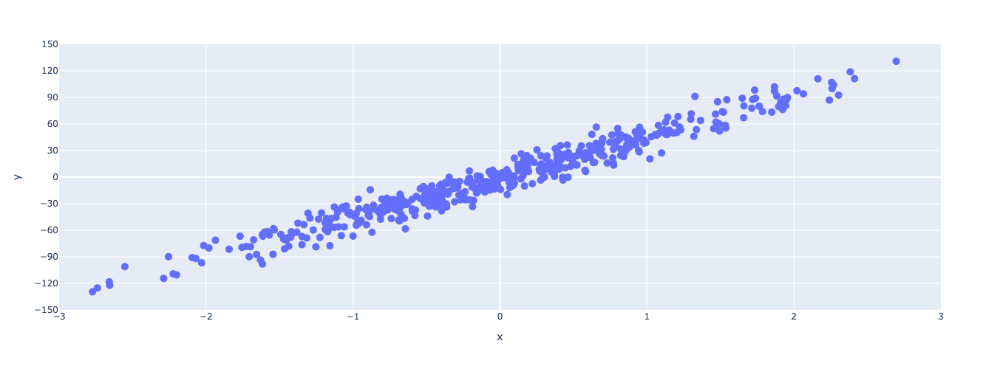

In [160]:
X, y = make_regression(n_samples=500, n_features=1, random_state=0, noise=10.0)
plot_regression(X, y)

- We know how to fit a simple linear regression to this data using sklearn:

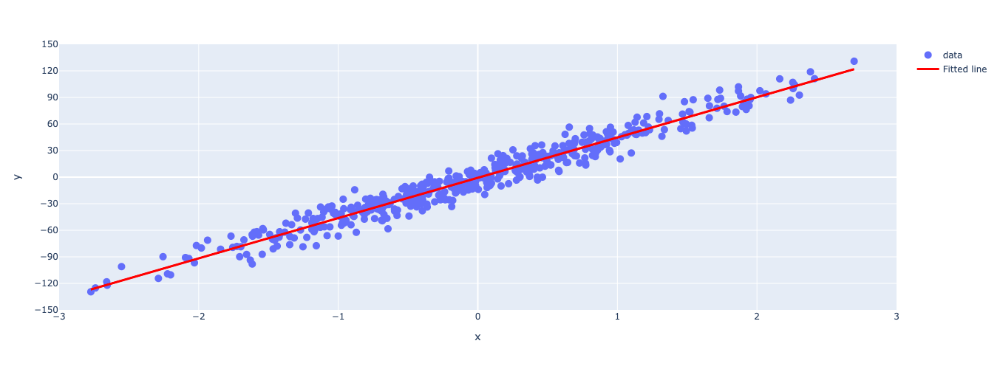

In [161]:
sk_model = LinearRegression().fit(X, y)
plot_regression(X, y, sk_model.predict(X))

- Here are the parameters of that fitted line:

In [162]:
print(f"w_0: {sk_model.intercept_:.2f} (bias/intercept)")
print(f"w_1: {sk_model.coef_[0]:.2f}")

w_0: -0.77 (bias/intercept)
w_1: 45.50


- As an equation, that looks like this:

$$\hat{y}=-0.77 + 45.50X$$

- Or in matrix form:

$$\begin{bmatrix} \hat{y_1} \\ \hat{y_2} \\ \vdots \\ \hat{y_n} \end{bmatrix}=\begin{bmatrix} 1 & x_1 \\ 1 & x_2 \\ \vdots & \vdots \\ 1 & x_n \end{bmatrix} \begin{bmatrix} -0.77 \\ 45.55 \end{bmatrix}$$

- Or in graph form I'll represent it like this: 

![](img/nn-1.png)

### 2). Linear Regression with a Neural Network in PyTorch

- So let's implement the above in PyTorch to start gaining an intuition about neural networks!
- Every neural network model you build in PyTorch will inherit from `torch.nn.Module`
- Remember [class inheritance from DSCI 511](https://www.tomasbeuzen.com/python-programming-for-data-science/lectures/lecture3-tests-classes.html#inheritance-subclasses)? Inheritance allows us to inherit commonly needed functionality without having to write code ourselves!

>We'll explore `torch.nn.Module` more in the lab but if it helps, think about sklearn models: they all inherit common methods like `.fit()`, `.predict()`, `.score()`, etc. When creating a neural network, we define our own architecture but still want common functionality which we inherit from `torch.nn.Module`.

- Let's create a model called `linearRegression` and then I'll talk you through the syntax:

##### a. `linearRegression` class

In [163]:
class linearRegression(nn.Module):  # our class inherits from nn.Module and we can call it anything we like
    def __init__(self, input_size, output_size):
        super().__init__()                                # super().__init__() makes our class inherit everything from torch.nn.Module
        self.linear = nn.Linear(input_size, output_size)  # this is a simple linear layer: wX + b

    def forward(self, x):
        out = self.linear(x)
        return out

Let's step through the above:

```python
class linearRegression(nn.Module):
    def __init__(self, input_size, output_size):
        super().__init__() 
```

^ Here we're creating a class called `linearRegression` and inheriting the methods and attributes of `nn.Module` (hint: try typing `help(linearRegression)` to see all the things we inheritied from `nn.Module`).

```python
        self.linear = nn.Linear(input_size, output_size)
```

^ Here we're defining a "Linear" layer, which just means `wX + b`, i.e., the weights of the network, multiplied by the input features plus the bias.

```python
    def forward(self, x):
        out = self.linear(x)
        return out
```

^ PyTorch networks created with `nn.Module` must have a `forward()` method. It accepts the input data `x` and passes it through the defined operations. In this case, we are passing `x` into our linear layer and getting an output `out`.

##### b. Model
- After defining the model class, we can create an instance of that class:

In [164]:
model = linearRegression(input_size=1, output_size=1)

![](img/nn-2.png)

- We can check out our model using `print()`:

In [165]:
print(model)

linearRegression(
  (linear): Linear(in_features=1, out_features=1, bias=True)
)


- Or the more useful `summary()` (which we imported at the top of this notebook with `from torchsummary import summary`):

In [166]:
summary(model, (1,));

Layer (type:depth-idx)                   Output Shape              Param #
├─Linear: 1-1                            [-1, 1]                   2
Total params: 2
Trainable params: 2
Non-trainable params: 0
Total mult-adds (M): 0.00
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00


- Notice how we have two parameters? We have one for the weight (`w1`) and one for the bias (`w0`)
- These were ***initialized randomly*** by PyTorch when we created our model. They can be accessed with `model.state_dict()`:

In [167]:
model.state_dict()

OrderedDict([('linear.weight', tensor([[-0.0923]])),
             ('linear.bias', tensor([0.5743]))])

- Okay, before we move on, our `x` and `y` data are currently numpy arrays but they need to be PyTorch tensors
- Let's convert them:

In [168]:
X_t = torch.tensor(X, dtype=torch.float32)  # I'll explain requires_grad next lecture
y_t = torch.tensor(y, dtype=torch.float32)

- We have a working model right now and could tell it to give us some output with this syntax:

In [169]:
y_p = model(X_t[0]).item()
print(f"Predicted: {y_p:.2f}")
print(f"   Actual: {y[0]:.2f}")

Predicted: 0.52
   Actual: 31.08


##### **c. loss func & optimizer**
- Our prediction is pretty bad because our model is not trained/fitted yet!
- As we learned in the past few lectures, to fit our model we need:
    1. **a loss function** (called "criterion" in PyTorch) to tell us how good/bad our predictions are - we'll use mean squared error, `torch.nn.MSELoss()`
    2. **an optimization algorithm** to help optimise model parameters - we'll use GD, `torch.optim.SGD()`

In [170]:
LEARNING_RATE = 0.1
criterion = nn.MSELoss()  # loss function
optimizer = torch.optim.SGD(model.parameters(), lr=LEARNING_RATE)  # optimization algorithm is SGD

##### d. dataloader
- Before we train I'm going to create a ***data loader*** to help batch my data
- We'll talk more about these next lecture and in lab but they are just ***generators that yield data to us on request*** ([remember generators from 511?](https://pages.github.ubc.ca/MDS-2020-21/DSCI_511_py-prog_students/lectures/lecture2-loops-functions.html#generators))
- We'll use a `BATCH_SIZE = 50` (which should give us 10 batches because we have 500 data points)

In [171]:
BATCH_SIZE = 50
dataset = TensorDataset(X_t, y_t)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

- We should have 10 batches:

In [172]:
print(f"Total number of batches: {len(dataloader)}")

Total number of batches: 10


- We can look at a batch using this syntax:

In [173]:
XX, yy = next(iter(dataloader))
print(f" Shape of feature data (X) in batch: {XX.shape}")
print(f"Shape of response data (y) in batch: {yy.shape}")

 Shape of feature data (X) in batch: torch.Size([50, 1])
Shape of response data (y) in batch: torch.Size([50])


##### e. fit the model
- With those, let's train our simple network for 5 epochs of SGD!
> I'll explain all the code here next lecture but scan throught it, it's not too hard to see what's going on!

In [174]:
def trainer(model, criterion, optimizer, dataloader, epochs=5, verbose=True):
    """Simple training wrapper for PyTorch network."""
    
    for epoch in range(epochs):
        losses = 0
        for X, y in dataloader:
            optimizer.zero_grad()       # Clear gradients w.r.t. parameters
            y_hat = model(X).flatten()  # Forward pass to get output
            loss = criterion(y_hat, y)  # Calculate loss
            loss.backward()             # Getting gradients w.r.t. parameters
            optimizer.step()            # Update parameters
            losses += loss.item()       # Add loss for this batch to running total
        if verbose: print(f"epoch: {epoch + 1}, loss: {losses / len(dataloader):.4f}")
   
trainer(model, criterion, optimizer, dataloader, epochs=5, verbose=True)

epoch: 1, loss: 682.3885
epoch: 2, loss: 102.2839
epoch: 3, loss: 93.5274
epoch: 4, loss: 93.5884
epoch: 5, loss: 93.6267


- Now our model has been trained, our parameters should be different than before:

In [175]:
model.state_dict()

OrderedDict([('linear.weight', tensor([[45.3447]])),
             ('linear.bias', tensor([-0.6981]))])

- Comparing to our sklearn model, we get the same answer:

In [176]:
pd.DataFrame({"w0": [sk_model.intercept_, model.state_dict()['linear.bias'].item()],
              "w1": [sk_model.coef_[0], model.state_dict()['linear.weight'].item()]},
             index=['sklearn', 'pytorch']).round(2)

,w0,w1
sklearn,-0.77,45.50
pytorch,-0.70,45.34


- We got pretty close! We could do better by changing the number of epochs or the learning rate
- So here is our simple network once again:

![](img/nn-2.png)

- By the way, check out what happens if we run `trainer()` again:

In [177]:
trainer(model, criterion, optimizer, dataloader, epochs=5, verbose=True)

epoch: 1, loss: 94.1156
epoch: 2, loss: 93.9838
epoch: 3, loss: 93.8043
epoch: 4, loss: 93.7612
epoch: 5, loss: 93.5906


- Our model continues where we left off!
- This may or may not be what you want. We can start from scratch by re-making our `model` and `optimizer`.

### 3). Multiple Linear Regression with a Neural Network

- Okay, let's do a multiple linear regression now with 3 features
- So our network will look like this:

![](img/nn-3.png)

- Let's go ahead and create some data:

In [178]:
# Create dataset
X, y = make_regression(n_samples=500, n_features=3, random_state=0, noise=10.0)
X_t = torch.tensor(X, dtype=torch.float32)
y_t = torch.tensor(y, dtype=torch.float32)
# Create dataloader
dataset = TensorDataset(X_t, y_t)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

- And let's create the above model:

In [179]:
model = linearRegression(input_size=3, output_size=1)

- We should now have 4 parameters (3 weights and 1 bias)

In [180]:
summary(model, (3,));

Layer (type:depth-idx)                   Output Shape              Param #
├─Linear: 1-1                            [-1, 1]                   4
Total params: 4
Trainable params: 4
Non-trainable params: 0
Total mult-adds (M): 0.00
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00


- Looks good to me! Let's train the model and then compare it to sklearn's `LinearRegression()`:

In [181]:
criterion = nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=LEARNING_RATE)
trainer(model, criterion, optimizer, dataloader, epochs=5, verbose=True)

epoch: 1, loss: 993.2316
epoch: 2, loss: 111.1200
epoch: 3, loss: 101.6617
epoch: 4, loss: 101.9839
epoch: 5, loss: 102.0360


In [182]:
sk_model = LinearRegression().fit(X, y)
pd.DataFrame({"w0": [sk_model.intercept_, model.state_dict()['linear.bias'].item()],
              "w1": [sk_model.coef_[0], model.state_dict()['linear.weight'][0, 0].item()],
              "w2": [sk_model.coef_[1], model.state_dict()['linear.weight'][0, 1].item()],
              "w3": [sk_model.coef_[2], model.state_dict()['linear.weight'][0, 2].item()]},
             index=['sklearn', 'pytorch']).round(2)

,w0,w1,w2,w3
sklearn,0.43,0.62,55.99,11.14
pytorch,0.06,0.51,56.33,11.40


### 4). Non-linear Regression with a Neural Network

- Okay so we can make a simple network to imitate simple and multiple *linear* regression
- You're probably thinking, so what? But we're getting to the good stuff I promise!
- For example, what happens when we have more complicated datasets like this?

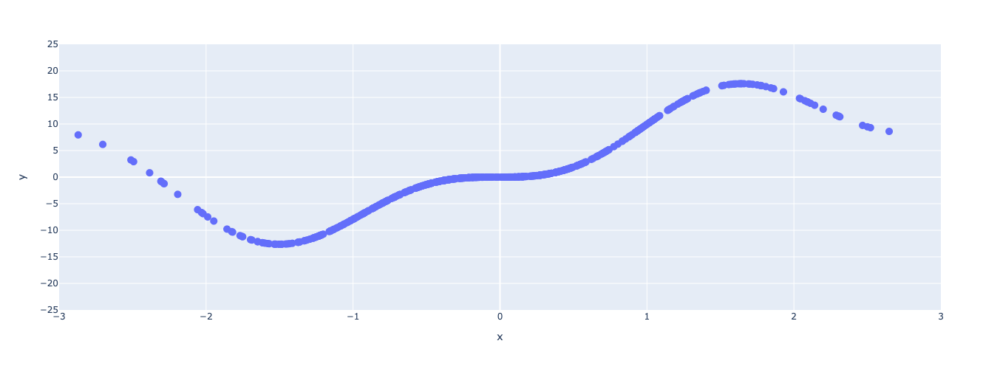

In [183]:
# Create dataset
np.random.seed(2020)
X = np.sort(np.random.randn(500))
y = X ** 2 + 15 * np.sin(X) **3
X_t = torch.tensor(X[:, None], dtype=torch.float32)
y_t = torch.tensor(y, dtype=torch.float32)
# Create dataloader
dataset = TensorDataset(X_t, y_t)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
plot_regression(X, y, y_range=[-25, 25], dy=5)

- This is obviously non-linear, and we need to introduce some **non-linearities** into our network
- These non-linearities are what make neural networks so powerful and they are called **"activation functions"**
- We are going to create a new model class that includes a non-linearity - a sigmoid function:

$$S(X)=\frac{1}{1+e^{-x}}$$

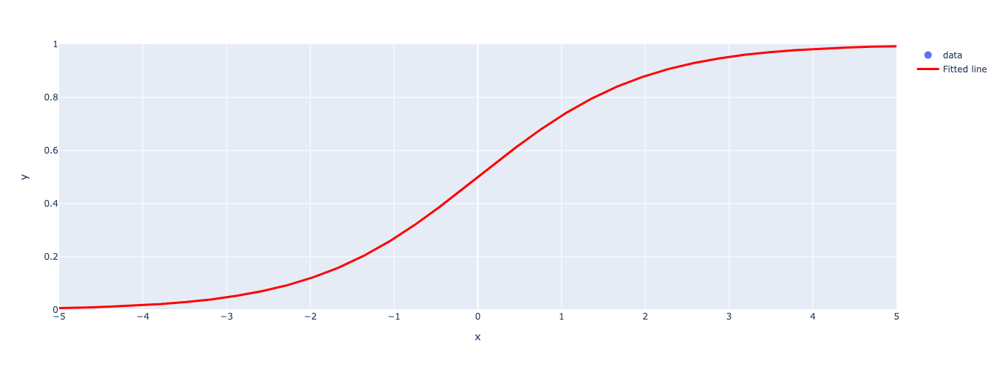

In [184]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

xs = np.linspace(-15, 15, 100)
plot_regression(xs, [0], sigmoid(xs), x_range=[-5, 5], y_range=[0, 1], dy=0.2)

- We'll talk more about activation functions later, but note how the sigmoid function ***non-linearly maps `x` to a value between 0 and 1***
- Okay, so let's create the following network:

![](img/nn-5.png)

##### a. Introduce non-linearity
- All this means is that <b><font size = 4 color=salmon>the value of each node in the hidden layer will be transformed by the "activation function", thus introducing non-linear elements to our model!</font></b>
- There's two main ways of creating the above model in PyTorch, I'll show you both:

In [185]:
class nonlinRegression(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super().__init__()
        self.hidden = nn.Linear(input_size, hidden_size)
        self.output = nn.Linear(hidden_size, output_size)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.hidden(x)       # input -> hidden layer
        x = self.sigmoid(x)      # sigmoid activation function in hidden layer
        x = self.output(x)       # hidden -> output layer
        return x

##### b. `nn.Sequential()` combine layers
- Note how our `forward()` method now passes `x` through the `nn.Sigmoid()` function after the hidden layer
- The above method is very clear and flexible, but I prefer using `nn.Sequential()` to combine my layers together in the constructor:

In [186]:
class nonlinRegression(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super().__init__()
        self.main = torch.nn.Sequential(
            nn.Linear(input_size, hidden_size),  # input -> hidden layer
            nn.Sigmoid(),                        # sigmoid activation function in hidden layer
            nn.Linear(hidden_size, output_size)  # hidden -> output layer
        )

    def forward(self, x):
        x = self.main(x)
        return x

- Let's make an instance of our new class and confirm it has 10 parameters (6 weights + 4 biases):

In [187]:
model = nonlinRegression(1, 3, 1)
summary(model, (1,));

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 1]                   --
|    └─Linear: 2-1                       [-1, 3]                   6
|    └─Sigmoid: 2-2                      [-1, 3]                   --
|    └─Linear: 2-3                       [-1, 1]                   4
Total params: 10
Trainable params: 10
Non-trainable params: 0
Total mult-adds (M): 0.00
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00


##### c. train model
- Okay, let's train:

In [188]:
criterion = nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.3)
trainer(model, criterion, optimizer, dataloader, epochs=5, verbose=True)

epoch: 1, loss: 42.3951
epoch: 2, loss: 13.2280
epoch: 3, loss: 11.7792
epoch: 4, loss: 12.5251
epoch: 5, loss: 7.0336


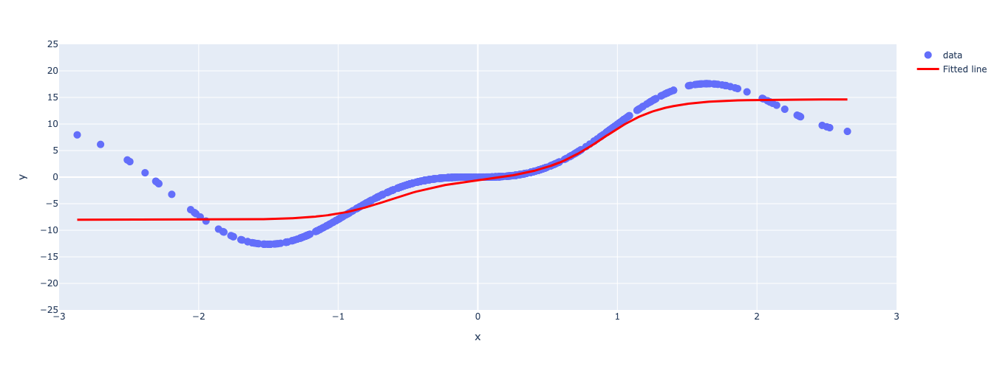

In [189]:
y_p = model(X_t).detach().numpy().squeeze()
plot_regression(X, y, y_p, y_range=[-25, 25], dy=5)

- Take a look at those non-linear predictions! Cool!
- Our model is not great and we could make it better soon by adjusting the learning rate, the number of nodes, and the number of epochs
- But I really want you to see how **each of our hidden nodes is "engineering a non-linear feature"** to be used for the predictions, check it out:

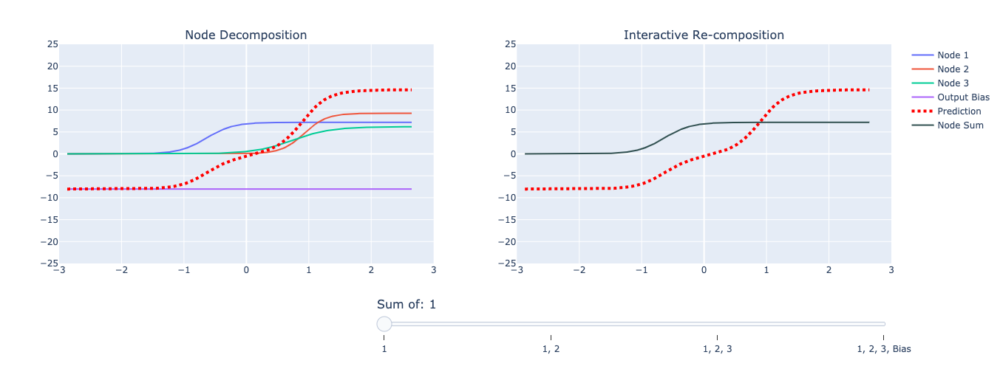

In [190]:
plot_nodes(X, y_p, model)

### 5). Deep Learning

- You've probably heard the magic term "deep learning" and you're about to find out what it means!
- Really, it's just a neural network with more than 1 hidden layer! Easy!
- I like to think of each layer as a "feature engineerer", it is trying to extract the maximum amount of information from the layer before it
- There are arguments of "deep network" (many layers) vs "wide network" (many nodes), but for big datasets, "deep networks" have been shown to be very effective in practice
- ***But just because the network is deeper, doesn't always mean it's better!***
- Let's create a "deep" network of 2 layers:

![](img/nn-6.png)

In [191]:
class deepRegression(nn.Module):
    def __init__(self, input_size, hidden_size_1, hidden_size_2, output_size):
        super().__init__()
        self.main = nn.Sequential(
            nn.Linear(input_size, hidden_size_1),
            nn.Sigmoid(),
            nn.Linear(hidden_size_1, hidden_size_2),
            nn.Sigmoid(),
            nn.Linear(hidden_size_2, output_size)
        )

    def forward(self, x):
        out = self.main(x)
        return out

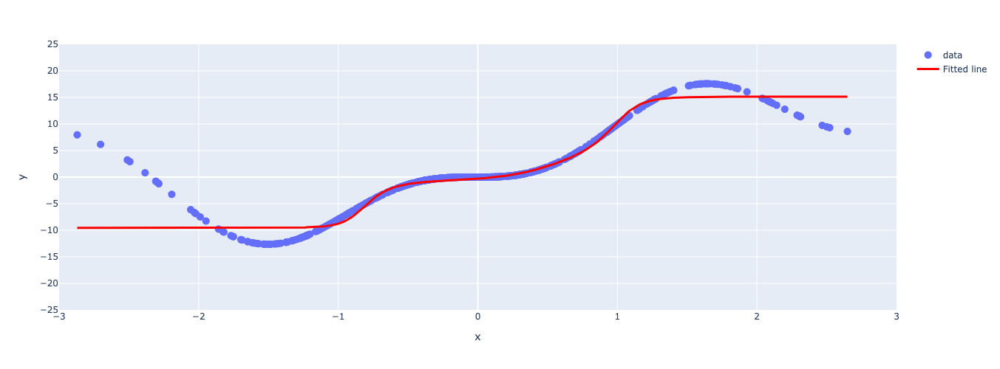

In [192]:
model = deepRegression(1, 5, 3, 1)
optimizer = torch.optim.SGD(model.parameters(), lr=0.3)
trainer(model, criterion, optimizer, dataloader, epochs=20, verbose=False)
plot_regression(X, y, model(X_t).detach(), y_range=[-25, 25], dy=5)

## 4. Activation Functions
<hr>

- As we learned above, activation functions are what allow us to model complex, non-linear functions
- There are **many** different activations functions:

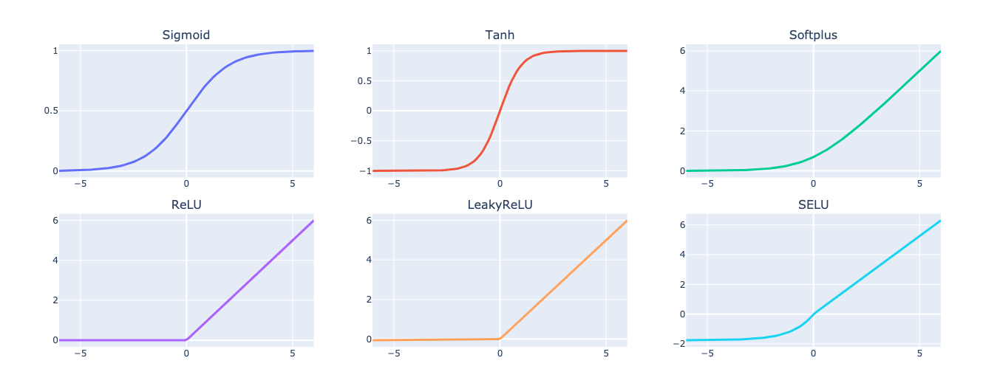

In [193]:
functions = [torch.nn.Sigmoid, torch.nn.Tanh, torch.nn.Softplus, torch.nn.ReLU, torch.nn.LeakyReLU, torch.nn.SELU]
plot_activations(torch.linspace(-6, 6, 100), functions)

- Activation functions should be non-linear and tend to be monotonic and continuously differentiable (smooth)
- But as you can see with the ReLU function above, that's not always the case!
- I wanted to point this out because it highlights how much of an art deep learning really is.
- Here's a great quote from [Yoshua Bengio](https://en.wikipedia.org/wiki/Yoshua_Bengio) (famous for his work in AI and deep learning) on his group experimenting with ReLU:

>"...one of the biggest mistakes I made was to think, like everyone else in the 90s, that you needed smooth non-linearities in order for backpropagation to work. because I thought that if we had something like rectifying nonlinearities, where you have a flat part, that it would be really hard to train, because the derivative would be zero in so many places. And when we started experimenting with ReLU, with deep nets around 2010, I was obsessed with the idea that, we should be careful about whether neurons won't saturate too much on the zero part. **But in the end, it turned out that, actually, the ReLU was working a lot better than the sigmoids and tanh, and that was a big surprise**...it turned out to work better, whereas I thought it would be harder to train!"

- Anyway, TL;DR **ReLU is probably the most popular these days**, but you can treat activation functions as hyperparams (to be optimized)

## 5. Neural Network Classification
<hr>

### 1). Binary Classification

- This will actually be the easiest part of the lecture
- Up until now, we've been looking at developing networks for regression tasks, but what if we want to do binary classification?
- Well, what did we do in Logistic Regression? We just passed the output of a regression into the Sigmoid Function to get a value between 0 and 1 (a probability of an observation belonging to the positive class) - we'll do the same thing here!
- Let's create a toy dataset:

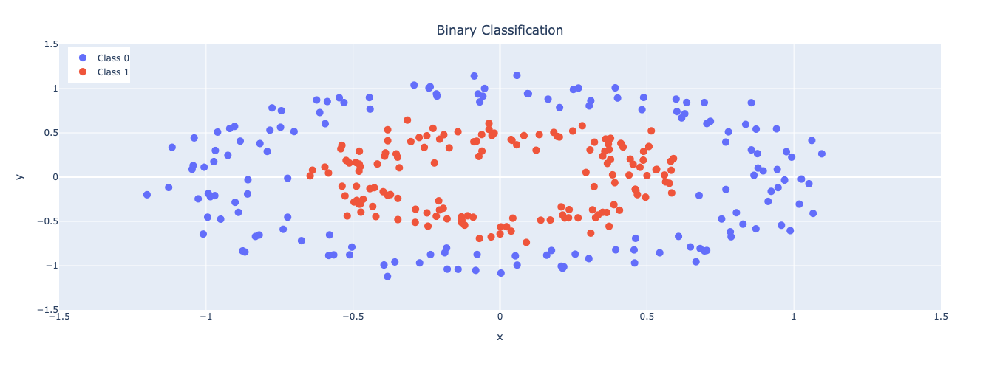

In [194]:
X, y = make_circles(n_samples=300, factor=0.5, noise=0.1, random_state=2020)
X_t = torch.tensor(X, dtype=torch.float32)
y_t = torch.tensor(y, dtype=torch.float32)
# Create dataloader
dataset = TensorDataset(X_t, y_t)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
plot_classification_2d(X, y)

- Let's create this network to model that dataset:

![](img/nn-7.png)

- I'm going to start using `ReLU` as our activation function(s) and `Adam` as our optimizer because these are what are currently, commonly used in practice.
- We are doing classification now so we'll need to use log loss (binary cross entropy) as our loss function:

$$f(w) = \sum_{x,y \in D} -y log(\hat{y}) - (1-y)log(1-\hat{y})$$

- In PyTorch, ***binary cross entropy loss*** criterion is `torch.nn.BCELoss`
- The formula expects a "probability" which is why we add a Sigmoid function to the end of out network.

In [195]:
class binaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super().__init__()
        self.main = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, output_size),
            nn.Sigmoid()  # <-- this will squash our output to a probability between 0 and 1
        )

    def forward(self, x):
        out = self.main(x)
        return out

##### a. Model
- **BUT WAIT!**
- While we can do the above and then train with a `torch.nn.BCELoss` loss function, there's a better way!
- We can omit the Sigmoid function and just use `torch.nn.BCEWithLogitsLoss` (which combines a Sigmoid layer and the BCELoss)
- Why would we do this? It's numerically stable! (Did you do the log-sum-exp question in Lab 1? We use it here for stability!)
- From the docs:
>"*This version is more numerically stable than using a plain Sigmoid followed by a BCELoss as, by combining the operations into one layer, we take advantage of the log-sum-exp trick for numerical stability.*"
- So actually, here's our model (no Sigmoid layer at the end because it's included in the loss function we'll use):

In [196]:
class binaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super().__init__()
        self.main = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, output_size)
        )

    def forward(self, x):
        out = self.main(x)
        return out

##### b. Train model & `BCEWithLogitsLoss`
- Let's train the model:

In [197]:
model = binaryClassifier(2, 5, 1)
criterion = torch.nn.BCEWithLogitsLoss() # loss function
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)  # optimization algorithm
trainer(model, criterion, optimizer, dataloader, epochs=20, verbose=True)

epoch: 1, loss: 0.6776
epoch: 2, loss: 0.6250
epoch: 3, loss: 0.5269
epoch: 4, loss: 0.4288
epoch: 5, loss: 0.3300
epoch: 6, loss: 0.2582
epoch: 7, loss: 0.1992
epoch: 8, loss: 0.1565
epoch: 9, loss: 0.1295
epoch: 10, loss: 0.1127
epoch: 11, loss: 0.0962
epoch: 12, loss: 0.0892
epoch: 13, loss: 0.0751
epoch: 14, loss: 0.0775
epoch: 15, loss: 0.0620
epoch: 16, loss: 0.0663
epoch: 17, loss: 0.0578
epoch: 18, loss: 0.0598
epoch: 19, loss: 0.0543
epoch: 20, loss: 0.0465


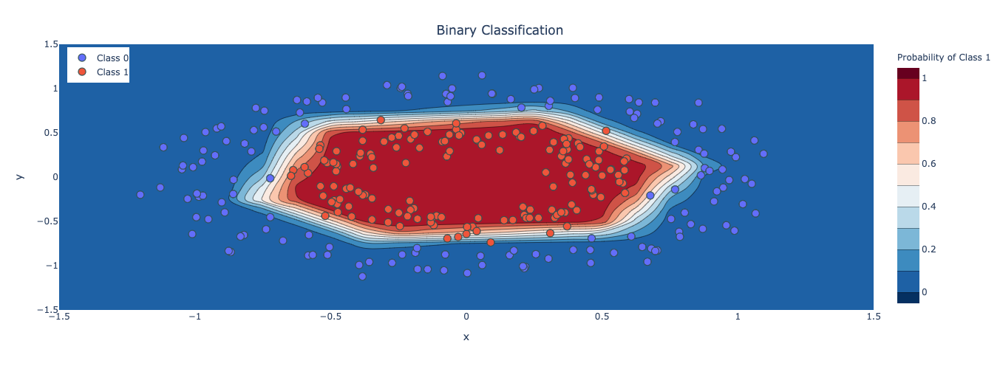

In [198]:
plot_classification_2d(X, y, model)

- To be clear, our model is just outputting some number between -∞ and +∞ (we aren't applying Sigmoid), so:
    - To get the probabilities we would need to pass them through a Sigmoid;
    - To get classes, we can apply some threshold (usually 0.5)
- For example, we would expect the point (0,0) to have a high probability and the point (-1,-1) to have a low probability:

In [199]:
prediction = model(torch.tensor([[0, 0], [-1, -1]], dtype=torch.float32)).detach()
print(prediction)

tensor([[ 14.4342],
        [-15.5707]])


In [200]:
probability = nn.Sigmoid()(prediction)
print(probability)

tensor([[1.0000e+00],
        [1.7288e-07]])


In [201]:
classes = np.where(probability > 0.5, 1, 0)
print(classes)

[[1]
 [0]]


### 2). Multiclass Classification (Optional)

- For multiclass classification, remember softmax?

$$\sigma(\vec{z})_i=\frac{e^{z_i}}{\sum_{j=1}^{K}e^{z_j}}$$

- It basically makes sure all the outputs are probabilities between 0 and 1, and that they all sum to 1.
- `torch.nn.CrossEntropyLoss` is a loss that combines a softmax with cross entropy loss.
- Let's try a 4-class classification problem using the following network:

![](img/nn-8.png)

In [202]:
class multiClassifier(torch.nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super().__init__()
        self.main = torch.nn.Sequential(
            torch.nn.Linear(input_size, hidden_size),
            torch.nn.ReLU(),
            torch.nn.Linear(hidden_size, output_size)
        )

    def forward(self, x):
        out = self.main(x)
        return out

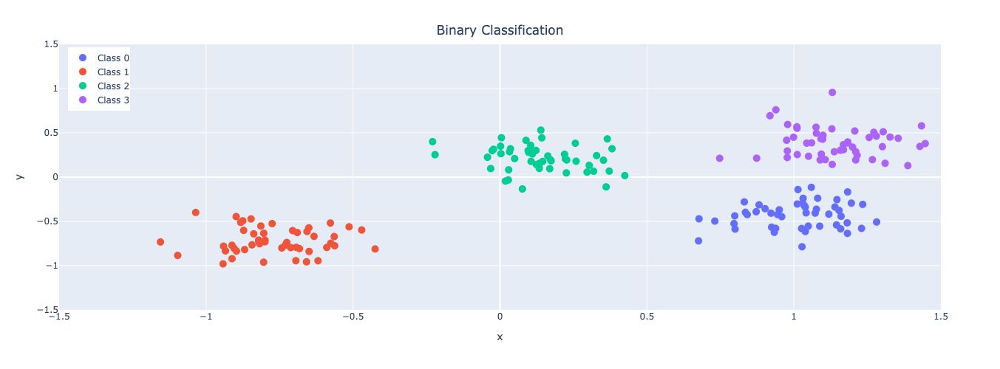

In [203]:
X, y = make_blobs(n_samples=200, centers=4, center_box=(-1.2, 1.2), cluster_std=[0.15, 0.15, 0.15, 0.15], random_state=12345)
X_t = torch.tensor(X, dtype=torch.float32)
y_t = torch.tensor(y, dtype=torch.int64)
# Create dataloader
dataset = TensorDataset(X_t, y_t)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
plot_classification_2d(X, y)

- Let's train this model:

In [204]:
model = multiClassifier(2, 5, 4)
criterion = torch.nn.CrossEntropyLoss() # loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.2)  # optimization algorithm

for epoch in range(10):
    losses = 0
    for X_batch, y_batch in dataloader:
        optimizer.zero_grad()       # Clear gradients w.r.t. parameters
        y_hat = model(X_batch)            # Forward pass to get output
        loss = criterion(y_hat, y_batch)  # Calculate loss
        loss.backward()             # Getting gradients w.r.t. parameters
        optimizer.step()            # Update parameters
        losses += loss.item()       # Add loss for this batch to running total
    print(f"epoch: {epoch + 1}, loss: {losses / len(dataloader):.4f}")

epoch: 1, loss: 1.0506
epoch: 2, loss: 0.4857
epoch: 3, loss: 0.1057
epoch: 4, loss: 0.0255
epoch: 5, loss: 0.0156
epoch: 6, loss: 0.0101
epoch: 7, loss: 0.0058
epoch: 8, loss: 0.0038
epoch: 9, loss: 0.0032
epoch: 10, loss: 0.0027


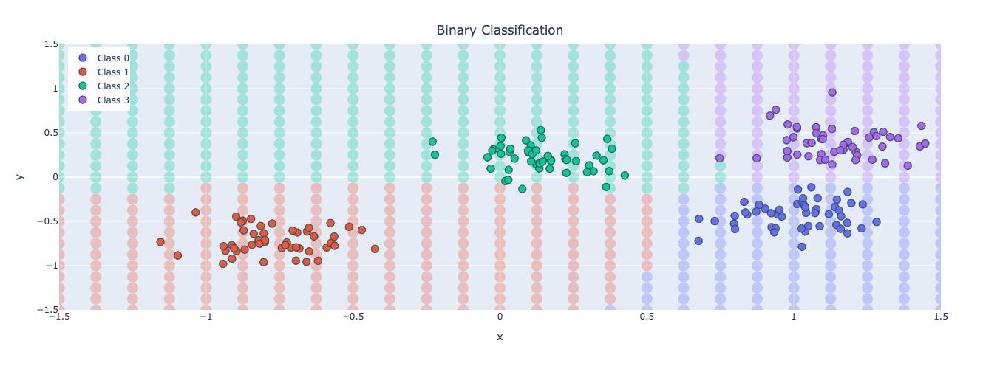

In [205]:
plot_classification_2d(X, y, model, transform="Softmax")

- To be clear once again, our model is just outputting some number between -∞ and +∞, so:
    - To get the probabilities we would need to pass them to a Softmax;
    - To get classes, we need to select the largest probability.
- For example, we would expect the point (-1,-1) to have a high probability of belonging to class 1, and the point (0,0) to have the highest probability of belonging to class 2.

In [206]:
prediction = model(torch.tensor([[-1, -1], [1,1]], dtype=torch.float32)).detach()
print(prediction)

tensor([[  0.8519,  18.8338,  -0.2590, -33.8930],
        [ -6.2590, -22.1832,   9.3243,  19.2865]])


- Note how we get 4 predictions per data point (a prediction for each of the 4 classes)

In [207]:
probability = nn.Softmax(dim=1)(prediction)
print(probability)

tensor([[1.5509e-08, 1.0000e+00, 5.1062e-09, 1.2620e-23],
        [8.0486e-12, 9.7711e-19, 4.7149e-05, 9.9995e-01]])


- The predictions should now sum to 1:

In [208]:
probability.sum(dim=1)

tensor([1.0000, 1.0000])

- We can get the class with maximum probability using `argmax()`:

In [209]:
classes = probability.argmax(dim=1)
print(classes)

tensor([1, 3])


## 6. Lecture Exercise: True/False Questions
<hr>

Answer True/False for the following:
1. Neural networks can be used for both regression and classification. (**True**)
2. For fully connected neural networks, the number of parameters $\geq$ the number of features. (**True**)
> - Fully connected neural networks (FCNNs) are a type of artificial neural network where the architecture is such that all the nodes, or neurons, in one layer are connected to the neurons in the next layer.
> - Features: # of features in original dataset
> - Parameters: # weights & bias in the whole neural network
> - Hyperparameters: # hidden layers and # hidden nodes for each hidden layer

3. Neural networks are parametric models. (**True**)
4. Any neural network with 3 hidden layers will have more parameters than any neural network with 2 hidden layers. (**False**)
> it depends on the hidden layer size (number of nodes in the hidden layer)
5. The architecture of a neural network (number of hidden layers and hidden nodes) is a hyperparameter. (**True**)
6. Like linear regression or logistic regression, with neural networks we can interpret each feature's weight value as a measure of the feature's importance. (**False**)
> When there are more layers,  there will be more weights than # of features, and weight represent the strength of the connection between units(layers). Therefore, it doesn't make sense to interpret each feature's weight value as a measure of the feature's importance.

7. The neural networks we've seen in [Lecture 4](https://pages.github.ubc.ca/MDS-2020-21/DSCI_572_sup-learn-2_students/lectures/lecture4_pytorch-neural-networks-pt1.html) are just recursive functions where each layer is made up of the previous layer's output, multiplied by some weights, with some biases added, and passed through an activation function (we call these networks "fully-connected feed-forward networks", but more on that next week). We don't usually include the input layer when counting up the layers in a network. So a 2 layer network (`L=2`) really means: 1 input layer, 1 hidden layer, 1 output layer. A 3 layer network (`L=3`) really means: 1 input layer, 2 hidden layers, 1 output layer.

Mathematically, our networks have the form:

$$ x^{(l+1)} = h\left( W^{(l)} x^{(l)} + b^{(l)}\right) $$

where:
- $W^{(l)}$ is a matrix of weights.
- $b^{(l)}$ is a vector of biases. 
- $x^{(l)}$ is the output of layer $l$:
    - $x^{(0)}$ are the inputs
    - $x^{(1)}$ are the outputs of the first hidden layers, i.e., $x^{(1)} = h\left( W^{(0)} x^{(0)} + b^{(0)}\right)$
    - etc.
    - $x^{(L)} = \hat{y}$
        - Classification: $\hat{y} = h\left( W^{(L-1)} x^{(L-1)} + b^{(L-1)}\right)$
        - Regression: $\hat{y} = W^{(L-1)} x^{(L-1)} + b^{(L-1)}$ (no activation!)

Suppose that we use a neural network with one hidden layer with a **ReLU activation** for a **regression** problem. After training, we obtain the following parameters:

$$\begin{align}W^{(0)} &= \begin{bmatrix}-2 & 2 & -1\\-1 & -2 & 0\end{bmatrix},  &b^{(0)}&=\begin{bmatrix}2 \\ 0\end{bmatrix} \\ W^{(1)} &= \begin{bmatrix}3 & 1\end{bmatrix},  &b^{(1)}&=-10\end{align}$$

For a training example with features $x = \begin{bmatrix}3 \\-2 \\ 2\end{bmatrix}$ what are the values in this network of $x^{(1)}$ and $\hat{y}$? Show your work using code cells or LaTeX.

In [210]:
relu = lambda x: np.maximum(x, 0)

x = np.array([[3, -2, 2]]).T


w0 = np.array([[-2, 2, -1],
               [-1, -2, 0]])
b0 = np.array([[2, 0]]).T


w1 = np.array([[3, 1]])
b1 = np.array([-10]).T

x1 = relu(w0 @ x + b0)
print("x1: ", x1.T)


y_hat = w1 @ x1 + b1
print(f"y_hat: {y_hat}")

x1:  [[0 1]]
y_hat: [[-9]]
